In [1]:
import pandas as pd

tweets = pd.read_csv('tweets.csv' )


In [2]:
tweets.columns

Index(['id_str', 'user-name', 'user-followers_count', 'retweet_count',
       'favorite_count', 'created_at', 'user-id', 'lang', 'user-name.1',
       'user-location', 'country_code', 'text'],
      dtype='object')

## Analysis of countries

Remove tweets with unknown country code

In [3]:
countries_tweets = tweets.dropna(subset=['country_code'])
print( countries_tweets.shape )

(97116, 12)


Remove country codes occurring only once; count occurrences of all the other countries

In [4]:
countries = countries_tweets.groupby('country_code')
countries = countries.filter(lambda x: len(x) > 5) 
countries = countries.groupby('country_code').size()



In [5]:
countries = countries.sort_values( ascending = False )

for c in countries.index:
    print(c , countries[c])


FR 41124
US 9689
GB 8689
ES 4939
IT 3539
CA 2604
DE 2570
IN 2350
BE 2215
NL 2154
SE 1380
MX 1099
VE 981
IE 811
AR 797
CL 789
TR 729
CH 709
BR 572
ZA 562
CO 547
PK 399
GR 372
PE 358
AU 351
NO 346
AT 331
FI 317
UA 306
HU 264
DK 264
EC 249
PT 246
KE 227
RU 175
JP 158
NZ 157
UY 149
LB 146
RO 141
CN 141
EG 138
IL 133
GT 127
LU 122
TN 120
PY 112
MQ 93
TZ 93
NG 90
CZ 89
HT 87
PL 86
PA 85
ET 81
SG 81
BG 79
DO 76
CI 70
SV 67
PH 65
HK 59
CR 55
MC 48
AE 48
CY 47
MA 44
RS 43
BN 43
IS 40
CM 37
GP 33
DZ 32
MG 31
KR 27
MW 27
EE 26
ID 26
HN 25
UG 25
QA 25
GI 23
MF 23
MK 22
GH 22
HR 21
VN 20
BD 18
TT 18
SI 17
BO 17
PG 16
MT 15
LV 14
GG 14
AQ 13
JO 13
RE 13
SK 11
MY 10
BY 10
TW 10
IR 10
CD 9
CU 9
BA 9
PR 8
TH 8
JM 8
SA 7
KH 7
GL 7
NI 7
SN 7
AF 6
LR 6


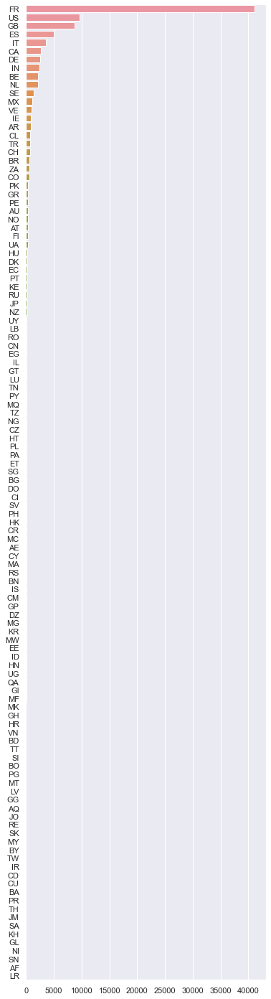

In [6]:
import seaborn as sns

sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(6,25)})

ax = sns.barplot(x=countries.tolist(), y= countries.index.tolist() )

## Languages


In [7]:
languages_tweets = tweets.dropna(subset=['lang'])

lang = languages_tweets.groupby('lang')
lang = lang.filter(lambda x: len(x) > 5) 
lang = lang.groupby('lang').size()

lang = lang.sort_values( ascending = False )


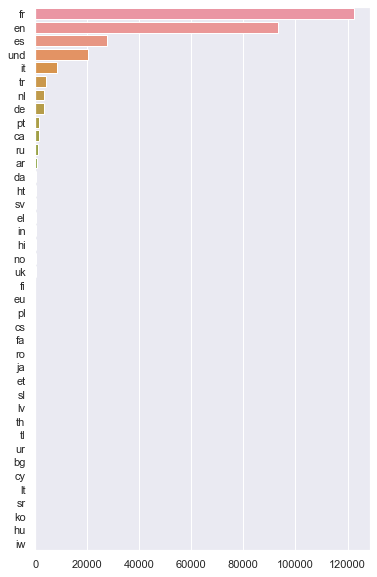

In [8]:
import seaborn as sns

sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(6,10)})

ax = sns.barplot(x= lang.tolist(), y= lang.index.tolist() )

## Sentiment analysis



In [9]:
tweets_eng = tweets[ tweets['lang'] == 'en']
print(tweets_eng.shape)

(93302, 12)


In [10]:
#import sys
#!pip install vaderSentiment

In [11]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer 

ana = SentimentIntensityAnalyzer()

all_scores = dict()

for index,row in tweets_eng.iterrows():
    scores = ana.polarity_scores( row['text'] )
    print( row['text'] + f":\n sentiment score: {scores['compound']} \n\n" )
    all_scores[row['text']] = scores['compound']
    

@HRHgearoid @philipnolan1 @Diarmaid_Twomey @FintanOToolbox Send message to #CharlieHebdo we have same problem with #Faminenotfunny people:
 sentiment score: -0.4019 


RT @sianpierre: WHOA. This is powerful. RT @RLOppenheimer: #CharlieHebdo http://t.co/2lsJlUgdpX:
 sentiment score: 0.4215 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @WSJ: Background on #CharlieHebdo and why the magazine was targeted in today's attack: http://t.co/dPKJNKF5Gx:
 sentiment score: -0.4767 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @Sophia_MJones: He drew first -- A powerful cartoon by @davpope on the deadly attack at satirical magazine #CharlieHebdo in Paris. htt…:
 sentiment score: -0.0772 


RT @Beltrew: He drew first powerful response to today's killings at #CharlieHebdo offices by Australian cartoonist David Pope http://t.co…


RT @CBCAlerts: In wake of #Paris #CharlieHebdo attack UN Security Council condemns 'this intolerable terrorist act targeting journalists a…:
 sentiment score: -0.8658 


RT @BBCtrending: #CharlieHebdo website also posted a link to images showing Je Suis Charlie (I Am Charlie) in different languages http:…:
 sentiment score: 0.0 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @ThomasPride: Retweet if you think satire should not be censored::
 sentiment score: 0.1139 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http:/…:
 sentiment score: 0.872 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensiv

RT @nikkibayley: So much pride for journalists who are -right now- planning how to bring out the next issue of #CharlieHebdo Awestuck by yo…:
 sentiment score: 0.3976 


RT @ofirgendelman: PM on the #CharlieHebdo attack:On behalf of all IsraelisI extend condolences to @fhollandethe bereaved families &amp; to t…:
 sentiment score: -0.34 


RT @pressfreedom: Press must stand together to send the message that murderous attempts to silence us will not stand #CharlieHebdo http:/…:
 sentiment score: -0.6369 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @ashokshrivasta6: Proud to be a Hindu #PK  The only tolerant religion of the world  #CharlieHebdo #ParisShooting  #PK:
 sentiment score: 0.6369 


You can draw blood but you'll only make us stronger #CharlieHebdo #unitedingrief @sardesairajdeep @BDUTT please do share:
 sentiment score: 0.8462 


@eNCAnews: VIDEO: #CharlieHebdo shootings spark Twitt


RT @shilpakannan: A 2012 cartoon by the @NewYorker - well worth remembering today #CharlieHebdo #ParisShooting http://t.co/6gOnSwwRfC:
 sentiment score: 0.4588 


RT @Beltrew: He drew first powerful response to today's killings at #CharlieHebdo offices by Australian cartoonist David Pope http://t.co…:
 sentiment score: -0.4019 


RT @cnnbrk: Were there accomplices? Investigators evaluating possible signal by gunman on #CharlieHebdo video source tells CNN. http://t.c…:
 sentiment score: 0.0 


If all these 'gods' are really omnipotent why do they need protection from worthless creation? they can't protect themselves? #CharlieHebdo:
 sentiment score: -0.5178 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @nytimesworld: Live updates on the deadly shooting at #CharlieHebdo offices in Paris: http://t.co/GmsnzC15JH:
 sentiment score: 0.0 


RT @MailOnline: #CharlieH


RT @grandludo: Google soutient #CharlieHebdo .:
 sentiment score: 0.0 


RT @woodelijah: My thoughts are with the victims and their families in Paris. #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.3182 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


#CharlieHebdo those who are teaching us of freedom of speech first let the Muslims of France live freely:) Burqa? Beard? Hypocrites.:
 sentiment score: 0.8156 


RT @AC360: Each and every American stands with you today - Secy @JohnKerry to the people of #France after #CharlieHebdo attack http://t.co/…:
 sentiment score: -0.4767 


RT @reuterspictures: A sign reads I am Charlie at a Paris vigil following the shoootings at #CharlieHebdo offices http://t.co/PQvYjsaz2L …:
 sentiment score: 0.0 


RT @God_Equals_Sant: Don't worry the next generation of Muslims will be just as peaceful... #CharlieHebdo http://t.co/GO7G0hI2mi:
 sentiment score: 0.6814


RT @RT_com: PHOTO: Massive rally in support of #CharlieHebdo attack victims in #Paris #JeSuisCharlie http://t.co/3Jsosc7yl3 http://t.co/Kqw…:
 sentiment score: -0.4019 


@AgentSaffron I only hope #CharlieHebdo comes back stronger and bolder cartoonists join the magazine and shame the religion of piss.:
 sentiment score: 0.4767 


RT @djvjgrrl: Happening now: A moment of silence in the city of #LeMans #France for the victims of the #CharlieHebdo #ParisAttack http://t.…:
 sentiment score: -0.3182 


RT @franceintheus: Flags flown at half mast at the French embassy in Washington DC #CharlieHebdo http://t.co/Cd2OolzGLN:
 sentiment score: 0.0 


RT @OMGPriyaMalik: Morons claiming that #CharlieHebdo 'provoked' these attacks remind me of morons who claim that rape victims provoke the …:
 sentiment score: -0.9538 


Oh no you won't! Every pencil is now against you. #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.3595 


#CharlieHebdo  #JeSuisCharlie trending http://t.co/FaJRqHm2vG:
 senti


RT @grandludo: Google soutient #CharlieHebdo .:
 sentiment score: 0.0 


RT @CRNetInt: 15 striking cartoons from cartoonists who won’t stay silent after #CharlieHebdo  http://t.co/6ZgmI0TXMt  http://t.co/S6ELrX9n…:
 sentiment score: 0.0 


RT @guardiannews: #CharlieHebdo attack: people gather at the Place de la Republique in Paris http://t.co/XPhZyspqIE Pic. AFP/Getty http://t…:
 sentiment score: -0.4767 


#CharlieHebdo #JeSuisCharlie #freedom from #tiranny RT @alfonslopeztena: http://t.co/EE1DQQyE83:
 sentiment score: 0.6369 


RT @WSJ: Background on #CharlieHebdo and why the magazine was targeted in today's attack: http://t.co/dPKJNKF5Gx:
 sentiment score: -0.4767 


A Short History of the Controversies and Violence That Have Dogged #CharlieHebdo: http://t.co/OuJeR73neP http://t.co/ebqVKtn62j:
 sentiment score: -0.6249 


RT @JAKeDetonator: Sad &amp; sickened by todays senseless killings. Love &amp; solidarity to all affected in France #jesuischarlie #CharlieHebdo ht…:
 sentiment s


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


We needed you all #CharlieHebdo:
 sentiment score: 0.0 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @abgutman: To all my Muslim friends: you don't need to apologize for the #CharlieHebdo attack in Paris. A criminal committed a crime no…:
 sentiment score: -0.7266 


Then they came for me—and there was no one left to speak for me. #CharlieHebdo 4/4:
 sentiment score: -0.296 


RT @RSF_RWB: We are horrified by the attack on French newspaper #CharlieHebdo. At least 12 people killed according to French authorities:
 sentiment score: -0.9022 


RT @DanHannanMEP: A #CharlieHebdo vigil is about to get underway in Trafalgar Square. Do come if you can. http://t.co/Rg0wLcXFzH:
 sentiment score: 0.0 


RT @MANJULtoons: Last message from #CharlieHebdo 


RT @bbcworldservice: Terrorists are winning in war against press freedom says UK commentator Douglas Murray on #CharlieHebdo attack http:…:
 sentiment score: -0.5423 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


Religions like all other ideas deserve criticism satire and yes our fearless disrespect #SalmanRushdie #CharlieHebdo:
 sentiment score: 0.34 


RT @AndrewBloch: A cartoon tribute to murdered cartoonists #CharlieHebdo:
 sentiment score: -0.6597 


RT @MidwinCharles: Murdered #CharlieHebdo Editor: 'I Prefer to Die Standing Up than Live on My Knees' http://t.co/vywRIE7x98 http://t.co/27…:
 sentiment score: -0.8519 


RT @YahooNewsUK: Je Suis Charlie: Online solidarity after #CharlieHebdo attack: http://t.co/YdU7gClpcQ http://t.co/OIAac7vcce:
 sentiment score: -0.2263 


RT @5Forty3: Proud of NDTV for upholding India's SECULAR credentials! Nidhi Razdan: N


Nous sommes #CharlieHebdo! Our thoughts are with those who lost their lives in Paris today. Free speech is an... http://t.co/2hgJN8diBA:
 sentiment score: 0.3164 


RT @RahulRadhakris: Shocking news about #CharlieHebdo expressed powerfully in a cartoon by @davpope. Free speech will never be a victim. ht…:
 sentiment score: 0.343 


More than 10000 people have gathered in Paris in support of freedom of expression. #CharlieHebdo #parisattack http://t.co/51PUUDxHS2:
 sentiment score: 0.7845 


Weapons of mass creation #CharlieHebdo http://t.co/BLU9T8mn5t:
 sentiment score: -0.2023 


RT @AmichaiStein1: Thousands gathered in Paris in solidarity with #CharlieHebdo journos #jesuischarlie http://t.co/KJ2I7kSEeG:
 sentiment score: 0.296 


@David_Cameron confirms to @faisalislam he has now had security briefing on Paris shooting from intel chiefs. #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.34 


RT @GuardianJessica: My take on the couilles molles who killed #CharlieHebdo journalists to


RT @LisaDaftari: Staff at French weekly @ParisMatch hold up signs in solidarity w/ #CharlieHebdo http://t.co/KJPnbn3D4n #JesuisCharlie:
 sentiment score: 0.296 


RT @grandludo: Google soutient #CharlieHebdo .:
 sentiment score: 0.0 


RT @Independent: The world's media pays tribute to #CharlieHebdo... http://t.co/dtfinSg7wW  #JeSuisCharlie http://t.co/1oK5QjjHi1:
 sentiment score: 0.0 


@letsnotbecynica: https://t.co/jLbIH0oyGt:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo http://t.co/R53jkcIOrY:
 sentiment score: 0.0 


Charlie Hebdo massacre in Paris. Gunmen kill at least 11 including magazine editor https://t.co/HAKlhZe2dm #CharlieHebdo:
 sentiment score: -0.6908 


RT @NopenotHope: The words of Chairman Nick - Nick Lowles on #CharlieHebdo 'they


RT @wilde: Wonder what new Terrorist Laws we'll need to protect us now?:
 sentiment score: -0.4767 


RT @sfiegerman: A list of publications that have opted to censor the #CharlieHebdo cartoons http://t.co/1gF3bom7RD:
 sentiment score: -0.4588 


RT @VikingBohman: This is not a religion Important to remember in times like this. #CharlieHebdo http://t.co/h2va5LS6Yb:
 sentiment score: 0.2283 


“@Ivarpi: If you strike us down we shall become more powerful than you can possibly imagine. #CharlieHebdo http://t.co/dybPiC3eET”:
 sentiment score: 0.3804 


RT @charliewinter: A real excerpt from a real article published by the Financial Times in reaction to #CharlieHebdo attacks. Appalling. htt…:
 sentiment score: -0.6597 


RT @OECD: We stand w/the int'l community in defense of freedom of press. Our thoughts R w/the victims &amp; families #CharlieHebdo http://t.co/…:
 sentiment score: 0.5267 


RT @SudheenKulkarni: Terrorist killings at #CharlieHebdo are a barbaric crime in the name of Islam

RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


12 powerful political cartoons responding to the #CharlieHebdo attack http://t.co/XRkMoqxhLX via @libbyanelson:
 sentiment score: -0.0772 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @deepamatic: Never put down your pen #CharlieHebdo http://t.co/KeQh4IRMw8:
 sentiment score: 0.0 


RT @ChadPergram: DHS Sec Jeh Johnson at Capitol. On #CharlieHebdo attack says we don't know what the nature of the attack is at this poin…:
 sentiment score: -0.7351 


Congratulations terrorists. I had never heard of #CharlieHebdo or seen those cartoons. Now I have.:
 sentiment score: -0.0516 


RT @MacLtoons: @americnhumanist Great quote - https://t.co/sDcT4clvNV #CharlieHebdo #JeSuisCharlie http://t.co/zxgUkxZL


RT @euronews: Queen Elizabeth II has sent a message of support to president @fhollande and the people of France http://t.co/RiNFxUezBM #Cha…:
 sentiment score: 0.4019 


RT @Sara__Firth: Solidarity Rally in #London tonight after #parisattack on #CharlieHebdo. #JeSuisCharlie http://t.co/dHEoMgyD4S:
 sentiment score: 0.296 


The murder of #CharlieHebdo journalists is appalling. But we should fear the coming #islamophobic backlash. https://t.co/T72x3wwDqc:
 sentiment score: -0.836 


RT @CRNetInt: Spanish cartoonists:  To arms companions! via @theturkishlife @sicevis #CharlieHebdo:
 sentiment score: 0.0 


RT @PersonalEscrito: #Paris right now: Thousands gathering to support to #CharlieHebdo http://t.co/aiSSi8gYHr @haloefekti @LatuffCartoons h…:
 sentiment score: 0.4019 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @AnupKaphle: Washington Post cartoonist @AnnTelnaes on #CharlieHebdo. http://


As a Muslim  I condemn today's terrorist act ..:
 sentiment score: -0.8074 


RT @BBCFreeSpeech: Cartoonists from around the world respond to #CharlieHebdo murders the only way they know how -http://t.co/ep2C0lGL1d ht…:
 sentiment score: -0.6124 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http:/…:
 sentiment score: 0.872 


RT @cupbadalona: Badalona racist mayor @AlbiolAlcalde_  relates immigration with terrorism just after #CharlieHebdo attack http://t.co/NN4…:
 sentiment score: -0.9136 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @RamziHabre: The New Yorker cartoon following the #CharlieHebdo incident. http://t.co/oq4bUId1BU:
 sentiment score: 0.0 


RT @ChristopherJM: .@lemondefr reports 8 journos 1 guest editor 1 office worker 2 policemen killed in #CharlieHebdo


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @cnni: Four prominent cartoonists were among the 12 people killed in terror attack: http://t.co/fkSfVeLucY #CharlieHebdo http://t.co/TjV…:
 sentiment score: -0.8658 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @cnni: Four prominent cartoonists were among the 12 people killed in terror attack: http://t.co/fkSfVeLucY #CharlieHebdo http://t.co/TjV…:
 sentiment score: -0.8658 


RT @CRNetInt: Spanish cartoonists:  To arms companions! via @theturkishlife @sicevis #CharlieHebdo:
 sentiment score: 0.0 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


#ParisShooting #Cha


RT @aliamjadrizvi: Freedom of speech means precisely the freedom to offend. Otherwise there'd be no point.:
 sentiment score: 0.7184 


RT @BBCBreaking: #CharlieHebdo website back online following the attack with one image saying Je Suis Charlie (I Am Charlie) http://t.c…:
 sentiment score: -0.4767 


RT @BreakingNews234: #BreakingNews: Atleast 11 People Confirmed Dead In French Magazine Terrorist Attack http://t.co/FJjCavkXq9 #CharlieHeb…:
 sentiment score: -0.9201 


RT @CronkiteSays: Breaking News:
 sentiment score: 0.0 


RT @arthurmacmillan: MT @hafezhakamii: Iran condemns Paris killings http://t.co/ijd5DDiE6j:
 sentiment score: -0.8316 


Midnight In Paris -- Excellent column by Charlie Pierce @ESQPolitics re #CharlieHebdo massacre http://t.co/l9D9EmVVxA:
 sentiment score: 0.5719 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


UPDATE The Full Charlie Hebdo Mohammad Cartoon&amp;#8211

RT @markfollman: Dutch political cartoonist @RLOppenheimer weighs in powerfully on #CharlieHebdo. http://t.co/RGIGhmZUW9:
 sentiment score: 0.0 


RT @FrankConniff: Terrorists scare me but you know what scares Terrorists? Cartoons. #CharlieHebdo:
 sentiment score: -0.9246 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BBCBreaking: We stand united with the French people against this threat to our values - David Cameron http://t.co/OYY2TfKqnu #Charl…:
 sentiment score: 0.128 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @reportedly: via @leNouvelObs the ex editor of #CharlieHebdo Philippe Val I have lost 


RT @Sara__Firth: Solidarity Rally in #London tonight after #parisattack on #CharlieHebdo. #JeSuisCharlie http://t.co/dHEoMgyD4S:
 sentiment score: 0.296 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


Wake up #France  from your apologistic/antisemitic slumber. Realize that radical Muslims are not just misunderstood innocents. #CharlieHebdo:
 sentiment score: 0.0572 


RT @simon_schama: #CharlieHebdo Satire was the father of true political freedom born in the 18th century; the scourge of bigots and tyrant…:
 sentiment score: 0.7906 


RT @AWordIfIMay: “@CronkiteSays::
 sentiment score: 0.0 


RT @guardiannews: #CharlieHebdo attack: people gather at the Place de la Republique in Paris http://t.co/X


RT @Tugotone: A message to all religions #CharlieHebdo http://t.co/bKlg6NX6vm:
 sentiment score: 0.0 


RT @FoxNews: President Obama calls #ParisShooting “cowardly evil” and an “attack on our free press.” #CharlieHebdo:
 sentiment score: 0.5106 


RT @franceonu: The Security Council condemns in the strongest terms the barbaric &amp; cowardly terrorist attack against #CharlieHebdo http://t…:
 sentiment score: -0.8555 


RT @BBCBreaking: Live: David Cameron &amp; Angela Merkel hold press conference hours after #CharlieHebdo attack http://t.co/rLaqtVgAH0 http://…:
 sentiment score: -0.4767 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


Outside the offices of #CharlieHebdo via @markmackinnon http://t.co/0C5mV2XPDY:
 sentiment score: 0.0 


RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo http://t.co/R53jkcIOrY:
 sentiment sco


RT @gwneff: #PrayforParis #JesuisCharlie #Democracy #Speakyourmind #CharlieHebdo 12 people were shot and killed in… http://t.co/01nONZvSH3:
 sentiment score: -0.6705 


What happened in Paris today was deplorable. My thoughts are with the victims' families and loved ones. #ParisShooting #CharlieHebdo:
 sentiment score: 0.3818 


RT @maddysavage: Here's scene at #Stockholm #French embassy. Silent rally in support of press freedom #CharlieHebdo #JeSuisCharlie http://t…:
 sentiment score: 0.7845 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @GermanyUN: In Berlin people gather in front of French Embassy to show solidarity after #CharlieHebdo attacks. #JeSuisCharlie http://t.…:
 sentiment score: -0.1779 


RT @hjalti: #CharlieHebdo RT @socdec: Charb one of the cartoonists killed today in Paris after receiving death threats. RIP. http://t.co/…:
 sentiment score: -0.9042 


RT @guardiannews: #Cha


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


Crying.  #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.4767 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


They tried to bury us. They didn't know we were seeds. #CharlieHebdo:
 sentiment score: 0.0 


RT @stuartf24: France 24 dons black armband as mark of respect to #CharlieHebdo #JeSuisCharlie http://t.co/t34I7gsEN2:
 sentiment score: 0.4767 


RT @Sara__Firth: Solidarity Rally in #London tonight after #parisattack on #CharlieHebdo. #JeSuisCharlie http://t.co/dHEoMgyD4S:
 sentiment score: 0.296 


RT @miasmo_: Time to all shit our pants and surrender more liberty! #ParisShooting #Char


RT @DoctorChristian: BRILLIANT @CRNetInt: Spanish cartoonists:  To arms companions! via @theturkishlife @sicevis #CharlieHebdo:
 sentiment score: 0.7027 


RT @Independent: The world's media pays tribute to #CharlieHebdo... http://t.co/dtfinSg7wW  #JeSuisCharlie http://t.co/1oK5QjjHi1:
 sentiment score: 0.0 


Yeah! MT@milaficent: I think this cartoon says it all. No idea who created it but kudos #CharlieHebdo #JeSuisCharlie http://t.co/sN4Ez0OMkM:
 sentiment score: 0.7385 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @CRNetInt: RT @MapsMaponyane:
 sentiment score: 0.0 


RT @reema_omer: Religions like all other ideas deserve criticism satire and yes our fearless disrespect -Salman Rushdie #CharlieHeb…:
 sentiment score: 0.34 


RT @LiteracyBatman: RT @CNN: At least 12 people were killed in today's attack on #CharlieHebdo an official says. http://t.co/dM48Fr


RT @eNCAnews: #CharlieHebdo has history of being provocative http://t.co/uUYO5pSol4 http://t.co/n7Vk4LV4LF:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Slate: Protesters at Place de la Republique are holding up pens as a show of solidarity http://t.co/zvaulLJN2K #CharlieHebdo http://t.c…:
 sentiment score: 0.0772 


RT @dhume: Kudos to @BDUTT for airing #CharlieHebdo cartoons on her show tonight. One silver lining to this ghastly day is solidarity of jo…:
 sentiment score: 0.6705 


RT @DajeyPetros: When Islamists with guns kill cartoonist


.@Channel4News here's an idea. European media simultaneously publish Mohammad cartoons making it clear where we stand #c4news #CharlieHebdo:
 sentiment score: 0.3818 


yet again a dark &amp; ugly day #CharlieHebdo :(:
 sentiment score: -0.7351 


RT @fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/KG2UwXmWce:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @dailyedge: 15 powerful responses from cartoonists to the #CharlieHebdo attack http://t.co/uN4y65zTWu (Cartoon by @davpope) http://t.co/…:
 sentiment score: -0.0772 


RT @TedRall: Attn editors: Please do not write an editorial decrying #CharlieHebdo attack unless you employ at least one full-time politica…:
 sentiment score: -0.2023 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 


RT @Sara__Firth: Solidarity Rally in #London tonight after #parisattack on #CharlieHebdo. #JeSuisCharlie http://t.co/dHEoMgyD4S:
 sentiment score: 0.296 


RT @vicenews: Video shows masked gunmen during attack on the offices of #CharlieHebdo: http://t.co/uyWVpiHs1U http://t.co/0syln5vX8m:
 sentiment score: -0.4767 


RT @khuldune: Any channel/paper that censors #CharlieHebdo cartoons in coverage DOES NOT 'stand in solidarity' with victims &amp; DOES NOT supp…:
 sentiment score: -0.6584 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @voxukraine: Love stronger than hate.:
 sentiment score: 0.4767 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @robinsappe: When night is falling... Resistance is waking up #CharlieHebdo #paris #placedelarepublique http://t.co/46qM


Cartoonists around the globe pen tributes to #CharlieHebdo victims http://t.co/7GRj6i594f  #JeSuisCharlie http://t.co/gCBFnjTEBA:
 sentiment score: -0.3182 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/GIb8owT0mg:
 sentiment score: 0.0 


Messages of solidarity for victims of today's Paris attack. #JeSuisCharlie #CharlieHebdo https://t.co/VCOOwyqkhD:
 sentiment score: -0.4939 


RT @GermanyUN: Chllr #Merkel: We will fight for the freedom of expression as well as for our other fundamental freedoms. MT @RegSprecher …:
 sentiment score: 0.7096 


RT @SasuPL: Only people who should die are fanaticswho thinks killing people is expression of their l


RT @icesur: This liar is using horrific #CharlieHebdo shootings as a pretext abusing people's lives for his political cause. http://t.co/G…:
 sentiment score: -0.9057 


RT @msalimkassam: How Prophet Muhammad reacted when he was insulted... Please read and share #CharlieHebdo #ParisShooting #NotInMyName http…:
 sentiment score: 0.0516 


No to violence. Do not use God's name to justify wrong actions #CharlieHebdo:
 sentiment score: -0.2514 


RT @God_Equals_Sant: Don't worry the next generation of Muslims will be just as peaceful... #CharlieHebdo http://t.co/GO7G0hI2mi:
 sentiment score: 0.6814 


“The ability to express ourselves freely is fundamental to a free society. - via Index on Censorship #CharlieHebdo:
 sentiment score: 0.8176 


RT @clancycnn: This is from 2013 edition of #AlQaeda magazine - Stephane Charbonnie of #CharlieHebdo among listed targets - http://t.co/vB3…:
 sentiment score: 0.0 


Long live the strong pen.:
 sentiment score: 0.5106 


RT @AmichaiStein1: Thousands


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @StateDept: .@JohnKerry &amp; #Poland's FM Schetyna spoke to press today about #CharlieHebdo attack. Watch: http://t.co/CiOy6meFoq. http://t…:
 sentiment score: -0.4767 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @officialroycey: This HAS to stop.:
 sentiment score: -0.296 


RT @reportedly: tran


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @markmackinnon: Hardest thing to find in Paris tonight is a copy of #CharlieHebdo. Sold out at every newsstand I've visited.:
 sentiment score: 0.0 


I think this is why Israel people feel the need to protect itself. #CharlieHebdo:
 sentiment score: 0.3818 


RT @amnestypress: A dark day for freedom of expression an appalling human tragedy. #JeSuisCharlie #CharlieHebdo http://t.co/IaTCXg8iD4:
 sentiment score: -0.4019 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @mattgallowaycbc: A @shawtooner @NewYorker cartoon from 2006. #charliehebdo http://t.co/Ga15pQPhaj:
 sentiment score: 0.0 


RT @Slate: Now's a goo


RT @SawyerHartman: A major problem of today is that real people are being killed because of imaginary people #CharlieHebdo This needs to be…:
 sentiment score: -0.8173 


RT @AnneLaumen: People now gathering at Pariser Platz in Berlin to show solidarity! #CharlieHebdo #JeSuisCharlie http://t.co/K4WPc8iNxx:
 sentiment score: 0.3595 


RT @nycjim: After 2012 attack #CharlieHebdo editor said: I'd rather die standing than live on my knees.” http://t.co/2xNLgoKrXy http://t.…:
 sentiment score: -0.7906 


Let's see for how much Barkha has bargained for in airing cartoons. Watch out fellas!! #CharlieHebdo:
 sentiment score: 0.0 


RT @reportedly: translation previous retweet: pencils are raised in front of European Parliament building in Bruxelles. Deafening silence…:
 sentiment score: -0.296 


RT @milaficent: I think this cartoon says it all. No idea who created it but kudos! #CharlieHebdo #JeSuisCharlie http://t.co/6hTUshNX4T:
 sentiment score: 0.685 


RT @xeni: #JeSuisCharlie: Long live


RT @GEsfandiari: #Iran condemns attack on #CharlieHebdo says terrorist attacks against innocent people violate Islamic teachings.:
 sentiment score: -0.9413 


RT @nycjim: R.I.P. Charb. Editor-in-chief of #CharlieHebdo among the 12 victims of terror attack in Paris. http://t.co/njgafrC5T1 http://t.…:
 sentiment score: -0.8316 


RT @Ivarpi: If you strike us down we shall become more powerful than you can possibly imagine. #CharlieHebdo http://t.co/AOVlkDNHc5:
 sentiment score: 0.3804 


@Chriskilley4 do you grant me permission to throw in my 2cents in re #CharlieHebdo? Remember am in JHB.:
 sentiment score: 0.3612 


RT @GuardianUS: #CharlieHebdo's spirit will endure despite this atrocity http://t.co/tNxAebuxV9 via @GuardianJessica:
 sentiment score: 0.1779 


RT @BBCBreaking: We stand united with the French people against this threat to our values - David Cameron http://t.co/OYY2TfKqnu #Charl…:
 sentiment score: 0.128 


RT @stephen_strydom: this is not a religion  #IamCharlie #Charl


RT @llm_s: Voltaire:I may not agree with what you say but I shall defend with all my power your right to say it#CharlieHebdo http://t.co…:
 sentiment score: -0.1419 


RT @guardiannews: #CharlieHebdo attack: people gather at the Place de la Republique in Paris http://t.co/XPhZyspqIE Pic. AFP/Getty http://t…:
 sentiment score: -0.4767 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @satishacharya: The little weapon! #CharlieHebdo #cartoon http://t.co/VFFZD2f8Rz:
 sentiment score: -0.2957 


RT @france7776: “We have no fear” shout the people of the  Republique #CharlieHebdo #JesuisCharlie http://t.co/mhIE7AIzoR TT @arminarefi @l…:
 sentiment score: -0.296 


RT @DartCenter: Tips on working with traumatic imagery: http://t.co/fHJ41LqzOh #ParisShooting #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.5719 


RT @katz: Tragic powerful drawing on #CharlieHebdo by C


RT @BBCBreaking: Police say 12 now dead in #CharlieHebdo attack including 2 police officers; prosecutor says gunmen still at large http://t…:
 sentiment score: -0.8126 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


Another cowardly &amp; senseless attack in the name of Islam. What makes idiots think Prophet needs honour avenged by violence? #CharlieHebdo:
 sentiment score: -0.7269 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @veganzulal: Fact: #Religion causes more problems than it solves. I condemn all violence against humans and animals. #CharlieHebdo http:…:
 sentiment score: -0.8221 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @BoingBoing: Long live comics and long live free

RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo http://t.co/R53jkcIOrY:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Sara__Firth: Pens &amp; Pencils held in the air at #London solidarity Rally after #CharlieHebdo Paris attack. #JeSuisCharlie http://t.co/WD…:
 sentiment score: -0.2263 


RT @Sophia_MJones: He drew first -- A powerful cartoon by @davpope on the deadly attack at satirical magazine #CharlieHebdo in Paris. htt…:
 sentiment score: -0.0772 


RT @atotalmonet: Silence is not where the answers to an incident like this lie. @tnyCloseRead on the #CharlieHebdo attack. http://t.co/yW…:
 sentiment score: -0.1531 


RT @Independent: There is a vigil in Trafalgar Square tonight in solidarity with #CharlieHebdo  http://t.co/K7ZHV9C27F http://t.co/x4gADFE5…:
 sentiment score: 0.296 


RT @AFP: AFP staff worldwide to hold a minute's 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


I wrote something about today's #CharlieHebdo killings. http://t.co/mmTrFlUGGU:
 sentiment score: -0.6705 


RT @VeryOldPics: #CharlieHebdo editor assassinated today in 2012:I prefer to die standing than to live on my knees. http://t.co/1iCbcV8…:
 sentiment score: -0.5994 


RT @cnnbrk: Every American stands with people of France after #CharlieHebdo attack @JohnKerry says. http://t.co/zUfxcG3Rfs:
 sentiment score: -0.4767 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQN


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @dailyedge: Thousands are sharing this New Yorker cartoon in response to the #CharlieHebdo shootings: http://t.co/qYCmoecwZk http://t.co…:
 sentiment score: 0.4215 


RT @cnni: Four prominent cartoonists were among the 12 people killed in terror attack: http://t.co/fkSfVeLucY #CharlieHebdo http://t.co/TjV…:
 sentiment score: -0.8658 


Europes struggle wiv Islamism #CharlieHebdo #Europe #Europereligion http://t.co/fd7MRsiA8y:
 sentiment score: -0.3182 


RT @Sophia_MJones: He drew first -- A powerful cartoon by @davpope on the deadly attack at satirical magazine #CharlieHebdo in Paris. htt…:
 sentiment score: -0.0772 


RT @TwitchyTeam: Actor Elijah Wood tweets in defense of #CharlieHebdo newspaper http://t.co/0wWJmE4XdU:
 sentiment score: 0.128 


Good to see vast majority standing up for #CharlieHebdo's right to offend. Hope feeling persis


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


Response to my Where are the White people denouncing White Supremacy #NAACPBombing #No2WhiteSupremacy #CharlieHebdo http://t.co/7j3E11W5lC:
 sentiment score: 0.0516 


#JeSuisCharlie #CharlieHebdo whoever are responsible are monsters:
 sentiment score: 0.3182 


RT @15MBcn_int: Paris half an hour before the call in solidarity with #CharlieHebdo:
 sentiment score: 0.296 


RT @amp6: My kinda protest. Photo by @MartinBureau1 #CharlieHebdo http://t.co/LtjoBl80wp:
 sentiment score: -0.1796 


RT @periqlytos: #Paris right now after #CharlieHebdo http://t.co/MmRmElTAqh:
 sentiment score: 0.0 


#CharlieHebdo MT @venkatananth: Here's our front page for tomorrow. Mint (@livemint) India. http://t.co/V4BQO4ermW:
 sentiment score: 0.0 


And like #CharlieHebdo itself no racism. Civilised society is even handed. #JeSuisCharlie:
 sentiment score: 0.6998 


RT @BBCBreaki


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @Sanity_3: Morons @Yair_Rosenberg: Beautiful: across France people rally in solidarity with #CharlieHebdo N freedom of speech http://t…:
 sentiment score: 0.8402 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @utarlington: The prophet Muhammad in caricatures has history of controversy. UTA prof Khanduri explores in new book. http://t.co/NHIEIF…:
 sentiment score: 0.0 


RT @notrexmurphy: “I don’t feel as though I’m killing someone with a pen. -Stephane Charbonnier 1967-2015 #CharlieHebd

RT @BBCNews: Follow live coverage of the #CharlieHebdo attack aftermath as world figures react http://t.co/bYZdVNd2S7 http://t.co/AcXjS147Mz:
 sentiment score: -0.4767 


RT @MaggieJordanACN: #charliehebdo @GLove39: The world would be a far better place if all religious fanatics followed this advice http://t.…:
 sentiment score: 0.4404 


RT @cesarmolinoss: Carl Sagan was right pointing at the greatest menace to humanity: religious fundamentalists @cescept @WIRED #CharlieHebd…:
 sentiment score: 0.25 


RT @Ldn_Ambulance: MT @LASNewham :Thinking of our #999Family colleagues dealing with aftermath of terrible events in Paris today #jesuischa…:
 sentiment score: -0.4767 


RT @AFP: RT @fgeffardAFP: #CharlieHebdo A man wearing an I am Charlie badge during a rally in Paris by @MartinBureau1 http://t.co/623l6aP…:
 sentiment score: 0.0 


And I should add Jonathan Swift to my satirical reading list as well. #CharlieHebdo #Satire #AModestProposal:
 sentiment score: 0.4404 


RT @AC360: French


Here in America we have freedom but it's never 100% there are always some laws attached to it  #CharlieHebdo:
 sentiment score: 0.3818 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


Cartoons and Messages of Solidarity with Charlie Hebdo flood Social Media #JeSuisCharlie #CharlieHebdo... http://t.co/ZrX3kc7zAU:
 sentiment score: 0.296 


Turkish solidarity with #CharlieHebdo #London @ Trafalgar Square http://t.co/0ZPgeoUqCF:
 sentiment score: 0.296 


RT @GermanyDiplo: #JeSuisCharlie: People gathering next to FrenchEmbassy in #Berlin to show #solidarity w/ #CharlieHebdo http://t.co/tZVcM1…:
 sentiment score: 0.296 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @michaeldickson: #CharlieHebdo attack now car set on fire outside synagogue -


RT @_dpaj: RT @Ian_Fraser: Putin sends Depardieu to Ukraine. Another #CharlieHebdo cover http://t.co/e6wOEnPBwJ:
 sentiment score: 0.0 


RT @satishacharya: The little weapon! #CharlieHebdo #cartoon http://t.co/VFFZD2f8Rz:
 sentiment score: -0.2957 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


RT @haaretzcom: Will #CharlieHebdo attack push France out of its corner in war on Islamic terror? – Opinion http://t.co/URF1I0XLZl http://t…:
 sentiment score: -0.886 


RT @UNESCO: We are all #CharlieHebdo. Our flag at half-staff in solidarity w/ France @Charlie_Hebdo_  &amp; freedom of expression http://t.co/…:
 sentiment score: 0.7506 


RT @BBCFreeSpeech: Cartoonists from around the world respond to #CharlieHebdo murders the only way they know how -http://t.co/ep2C0lGL1d ht…:
 sentiment score: -0.6124 


RT @SaifRRahman: #CharlieHebdo also makes fun of Jewish and Ch


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @FrancisWheen: The best tribute to murdered cartoonists is a cartoon. From @davpope #CharlieHebdo http://t.co/gDQqqp4b6b:
 sentiment score: -0.0516 


RT @Edupalacios77: Magnigica!!! #CharlieHebdo  http://t.co/fv1M54o1UX@raymacaricatura @Zapata_zos @laureanomar @Leonardo_Padron @mendezgue…:
 sentiment score: 0.0 


RT @djvjgrrl: Thousands gather in solidarity at the old Port of #Marseille #France #CharlieHebdo #ParisShooting via @christlet http://t.co/…:
 sentiment score: 0.296 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @BBCFreeSpeech: Cartoonists from around the world respond to #CharlieHebdo murders the only way they know how -http://t.co/ep2C0lGL1d ht…:
 sentiment score: -0.6124 





RT @TPM: #CharlieHebdo staffer says the attack lasted 5 minutes: They spoke French perfectly...claiming to be Al-Qaida http://t.co/vbcbNj…:
 sentiment score: -0.4767 


RT @SecularlyYours: If you are not condemning the #Islamic ideology that killed 12 at #CharlieHebdo your sympathy doesn't mean shit.:
 sentiment score: -0.0196 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @RT_com: PHOTO: Massive rally in support of #CharlieHebdo attack victims in #Paris #JeSuisCharlie http://t.co/3Jsosc7yl3 http://t.co/Kqw…:
 sentiment score: -0.4019 


@BBCFreeSpeech @jasondeansy @guardian  Perhaps would've been more precise to say the #CharlieHebdo attack - not the magazine itself:
 sentiment score: -0.4767 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of e


RT @Sara__Firth: The last tweet #CharlieHebdo sent this morning depicted #ISIS leader Abu Bakr al-Baghdadi. http://t.co/BXwkfT4feF:
 sentiment score: 0.0 


Christians wants oil while muslims blood. What kind of God they reveres ?? #CharlieHebdo #ParisShooting:
 sentiment score: 0.2885 


RT @cnni: Four prominent cartoonists were among the 12 people killed in terror attack: http://t.co/fkSfVeLucY #CharlieHebdo http://t.co/TjV…:
 sentiment score: -0.8658 


RT @patrickgaley: In solidarity with #CharlieHebdo. (Photo from @AFPphoto) http://t.co/iYE1ltmfya:
 sentiment score: 0.296 


RT @sophiebr: Very moving... RT @AFPphoto #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/9ER4NOhwRD:
 sentiment score: 0.0 


RT @GermanyDiplo: #JeSuisCharlie: People gathering next to FrenchEmbassy in #Berlin to show #solidarity w/ #CharlieHebdo http://t.co/tZVcM1…:
 sentiment score: 0.296 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @NewsOutback: People bring flowers candles to #France embassy in #Moscow. http://t.co/l2mBQdEn85 #JeSuisCharlie #CharlieHebdo http://t.…:
 sentiment score: 0.0 


RT @fgautier26: Sad truth is that if u crticize #islam even after #CharlieHebdo massacre u wl still b labeled 'right wing fanatic' or isl…:
 sentiment score: -0.2023 


RT @FoxNews: “These terrorists fear freedom of speech and freedom of the press.” – President #Obama on #CharlieHebdo shooting http://t.co/3…:
 sentiment score: 0.2732 


RT @MrsGandhi: They keep killing &amp; we keep doing candle light protests! Nonsense!:
 sentiment score: -0.8619 


RT @GermanyUN: In Berlin people gather in front of French Embassy to sho


RT @RT_com: PHOTO: Massive rally in support of #CharlieHebdo attack victims in #Paris #JeSuisCharlie http://t.co/3Jsosc7yl3 http://t.co/Kqw…:
 sentiment score: -0.4019 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BBCFreeSpeech: Steve Bell from the @guardian hits out at the 'posturing maniacs' responsible for #CharlieHebdo http://t.co/T0L8XymgqW:
 sentiment score: 0.0258 


RT @EdgeofSports: You don't honor the life of #CharlieHebdo by slandering muslims. Using racist slurs doesn't make you Mario Savio. It just…:
 sentiment score: -0.7669 


RT @davidwalliams: Executing unarmed cartoonists can never be the will of any God. #CharlieHebdo:
 sentiment score: 0.2732 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


@DrGPradhan:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thought


With regards to #CharlieHebdo  this anarchist does not agree!:
 sentiment score: -0.3404 


RT @BaptisteGaudin: If your religion is worth killing for please start with yourself #CharlieHebdo:
 sentiment score: -0.296 


RT @LuLzWarfare: It seems that the #Islamists are becoming experts at shooting themselves in the foot. #CharlieHebdo:
 sentiment score: 0.0 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @Sophia_MJones: He drew first -- A powerful cartoon by @davpope on the deadly attack at satirical magazine #CharlieHebdo in Paris. htt…:
 sentiment score: -0.0772 


RT @xeni: #JeSuisCharlie: Long live comics and long live freedom of the press. #CharlieHebdo http://t.co/xznTBctuZL http://t.co/KeqePRvdbA:
 sentiment score: 0.6369 


RT @UCDavisLaw: Professor Karima Bennoune speaks on @HuffPostLive about the #CharlieHebdo tragedy in #France. http://t.co/Htrb


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


RT @UlrichJvV: May we find strength &amp; peace midst this insanity. Never be silenced! RIP #CharlieHebdo French satirists shot in Paris http:/…:
 sentiment score: 0.5093 


RT @cnnbrk: President Obama says #CharlieHebdo attack shows terrorists fear freedom http://t.co/mUlsXbstAM http://t.co/UdX8UxI7gJ:
 sentiment score: -0.7351 


RT @ClaudeMoraesMEP: People gathering outside the European Parliament just now in solidarity #CharlieHebdo http://t.co/QeMHeJyOZj:
 sentiment score: 0.296 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @AFPphoto: #JeSuisCharlie trib


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @dallasnews: .@DallasPolitics: Evil cannot stand to be mocked. So let’s all mock it. http://t.co/mMIqsH83OE #charliehebdo http://t.co/Ur…:
 sentiment score: -0.8678 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @Jacques_Shark: #CharlieHebdo's editor Charb assassinated today said in 2012:I prefer to die standing than to live on my knees. http…:
 sentiment score: -0.5994 


#CharlieHebdo's editor Charb assassinated today said in 2012:I prefer to die standing than to live on my knees. http://t.co/03uxFVe9hj:
 sentiment score: -0.5994 


RT @frielingbailey: I may disapprove of what you say but I will defend to the death your right to say it. ~Voltaire #CharlieHebdo http:/…:
 sentiment score: -0.7469 


RT @itvnews: Thou


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


Because of the #CharlieHebdo attack there'll be no #ChicagoPD tonite in France. It is reported out of respect for the victims. @SophiaBush:
 sentiment score: -0.5423 


RT @DoctorChristian: BRILLIANT @CRNetInt: Spanish cartoonists:  To arms companions! via @theturkishlife @sicevis #CharlieHebdo:
 sentiment score: 0.7027 


RT @RT_com: PHOTO: Massive rally in support of #CharlieHebdo attack victims in #Paris #JeSuisCharlie http://t.co/3Jsosc7yl3 http://t.co/Kqw…:
 sentiment score: -0.4019 


Rest in peace. 🙏 #CharlieHebdo #JeSuisCharlie http://t.co/VNeWonMrhT:
 sentiment score: 0.5423 


RT @AppSapp: RT @dabeard: RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris 


RT @MANJULtoons: Last message from #CharlieHebdo cartoonists to their killers. My #cartoon http://t.co/yRnaWVcOjf:
 sentiment score: -0.6486 


RT @suhelseth: Religions are supposed to spread love so I wonder why some believers in one are so hell-bent on inviting hatred? #CharlieHeb…:
 sentiment score: 0.3744 


RT @AnupKaphle: Wow. @RLOppenheimer's cartoon today on #CharlieHebdo speaks more than a thousand words. http://t.co/O1IQRJJXn9:
 sentiment score: 0.5859 


RT @abelicc: #France has a problem (and quite a serious one) #CharlieHebdo http://t.co/H15l2ARF3d:
 sentiment score: -0.507 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @Jonathon_Shafi: #KillAllMuslims is trending. I stand unequivocally with Muslims under racist attack. So should you it strengthens us a…:
 sentiment score: -0.6249 


RT @TheTurkishLife: Spanish cartoonists are sharing this image with the m


RT @sarahs_pen: Really great cartoons from artists around the world in response to #CharlieHebdo attack: http://t.co/ikWs3Ux2MX #JeSuisChar…:
 sentiment score: 0.3167 


RT @nycjim: After 2012 attack #CharlieHebdo editor said: I'd rather die standing than live on my knees.” http://t.co/2xNLgoKrXy http://t.…:
 sentiment score: -0.7906 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @RT_com: PHOTO: Massive rally in support of #CharlieHebdo attack victims in #Paris #JeSuisCharlie http://t.co/3Jsosc7yl3 http://t.co/Kqw…:
 sentiment score: -0.4019 


RT @globeandmail: How international cartoonists are responding to #CharlieHebdo  http://t.co/wr41WI6y3G http://t.co/nbzYtCrBcC:
 sentiment score: 0.0 


RT @doberah: 100s turn out for #CharlieHebdo vigil in Berlin many holding lighted candles or EU flags http://t.co/bKPFJSpfu7:
 sentiment score: 0.0 


RT @BBCBreaking: Parisians raise pens during a rally in


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


Really sad :( #CharlieHebdo http://t.co/pWyRzxJE72:
 sentiment score: -0.763 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


At Least 12 Dead In Shooting At Satirical Publication's Office In #Paris http://t.co/GvX2wr9hju #jesuischarlie #charliehebdo #freepress:
 sentiment score: -0.6486 


What the hell is wrong with this world??? #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.8496 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


My thoughts are with the victims &amp; their loved ones of the barbaric #CharlieHebdo attack.:
 sentiment score: -0.128 


RT @NewsThisSecond: AFP release a photo of staff in newsroom in response to #parisattack #CharlieHebdo htt


RT @HayekMG: Again when a cartoon is worth 1000 words | By Robert Mankoff The  @NewYorker Sept 2012 | #CharlieHebdo (@BobMankoff) http://t…:
 sentiment score: 0.2263 


RT @HayekMG: Again when a cartoon is worth 1000 words | By Robert Mankoff The  @NewYorker Sept 2012 | #CharlieHebdo (@BobMankoff) http://t…:
 sentiment score: 0.2263 


RT @HayekMG: The power of the pen: #Cartoonists &amp; #Journalists around the world honor #CharlieHebdo victims #JeSuisCharlie #France http://t…:
 sentiment score: 0.2263 


RT @HayekMG: The power of the pen: #Cartoonists &amp; #Journalists around the world honor #CharlieHebdo victims #JeSuisCharlie #France http://t…:
 sentiment score: 0.2263 


RT @HayekMG: Again when a cartoon is worth 1000 words | By Robert Mankoff The  @NewYorker Sept 2012 | #CharlieHebdo (@BobMankoff) http://t…:
 sentiment score: 0.2263 


RT @HayekMG: Again when a cartoon is worth 1000 words | By Robert Mankoff The  @NewYorker Sept 2012 | #CharlieHebdo (@BobMankoff) http://t…:
 se


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @clarionproject: Express solidarity w/ victims of #CharlieHebdo attack using #JeSuisCharlie (I am Charlie) to support freedom of express…:
 sentiment score: 0.5719 


Stop religion terrorism! #CharlieHebdo:
 sentiment score: -0.7959 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @stephe


RT @HouseForeign: Chairman @RepEdRoyce on attack against #CharlieHebdo in #France: I join in strongly condemning terrorist attack... http:/…:
 sentiment score: -0.8225 


RT @RahulRadhakris: Shocking news about #CharlieHebdo expressed powerfully in a cartoon by @davpope. Free speech will never be a victim. ht…:
 sentiment score: 0.343 


RT @abgutman: To all my Muslim friends: you don't need to apologize for the #CharlieHebdo attack in Paris. A criminal committed a crime no…:
 sentiment score: -0.7266 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BBCFreeSpeech: Steve Bell from the @guardian hits out at the 'posturing maniacs' responsible for #CharlieHebdo http://t.co/T0L8XymgqW:
 sentiment score: 0.0258 


RT @Ostrov_A: Best response to the #Islamic terrorists who attacked #CharlieHebdo is to republish their cartoons over &amp; over again http://…:
 sentiment score: -0.4404 


RT @B


RT @CRNetInt: 15 striking cartoons from cartoonists who won’t stay silent after #CharlieHebdo  http://t.co/6ZgmI0TXMt  http://t.co/S6ELrX9n…:
 sentiment score: 0.0 


RT @Fisher_Library: Satirical cartooning has a long history: this is from early 1800s by George Cruikshank. We stand with #CharlieHebdo. ht…:
 sentiment score: 0.0 


RT @WhispersNewsLTD: Satire Vows Not To Negotiate With Terrorists http://t.co/Jw51N8MOOs #satire #jesuischarlie #charliehebdo http://t.co/s…:
 sentiment score: -0.6249 


RT @Ivarpi: If you strike us down we shall become more powerful than you can possibly imagine. #CharlieHebdo http://t.co/AOVlkDNHc5:
 sentiment score: 0.3804 


RT @froomkin: #CharlieHebdo’s Charb: I would rather die standing up than live on my knees” http://t.co/x45prBStC8 http://t.co/zQeunjOOCX:
 sentiment score: -0.5994 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.865


RT @CogitoErgoBake: Nothing is more despicable than respect based on fear. - Camus. So sad. Thoughts to the families friends and free sp…:
 sentiment score: 0.3762 


RT @BBCFreeSpeech: Steve Bell from the @guardian hits out at the 'posturing maniacs' responsible for #CharlieHebdo http://t.co/T0L8XymgqW:
 sentiment score: 0.0258 


RT @globeandmail: How international cartoonists are responding to #CharlieHebdo  http://t.co/wr41WI6y3G http://t.co/nbzYtCrBcC:
 sentiment score: 0.0 


@RT_com @seanonolennon the perpetrators of violence cannot silence #CharlieHebdo:
 sentiment score: -0.7269 


RT @DraggoTigger: they r discussing #CharlieHebdo:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @adelgadoRne: Place de Luxembourg. Junto al Parlamento Europeo. Je suis Charlie #CharlieHebdo http://t.co/cMmcT1vOTl:
 sentiment score: 0.0 


RT @sbeaugeAFP: #JeSuisCharlie tribute to #Ch


RT @newsfirstlive: More than 10000 people have gathered in Paris in support of freedom of expression. #CharlieHebdo #parisattack http://t.…:
 sentiment score: 0.7845 


“@cnnbrk: President Obama says #CharlieHebdo attack shows terrorists fear freedom // says the man who blames attacks on YouTube videos:
 sentiment score: -0.8957 


RT @AnneLaumen: People now gathering at Pariser Platz in Berlin to show solidarity! #CharlieHebdo #JeSuisCharlie http://t.co/K4WPc8iNxx:
 sentiment score: 0.3595 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @RT_com: Controversial novel on France under Islamist rule released amid shock over #CharlieHebdo http://t.co/mBb6c9azpi http://t.co/t2O…:
 sentiment score: -0.2732 


RT @15MBcn_int: Trafalgar Sq London in solidarity with #CharlieHebdo:
 sentiment score: 0.296 


RT @Independent: There is a vigil in Trafalgar Square tonight in


RT @cnnbrk: President Obama says #CharlieHebdo attack shows terrorists fear freedom http://t.co/mUlsXbstAM http://t.co/UdX8UxI7gJ:
 sentiment score: -0.7351 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @sarkar_swati: Hope Indian media publishes #CharlieHebdo cartoons in solidarity with their French colleagues. I suspect the cowards won't:
 sentiment score: 0.4404 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @markfollman: Dutch political cartoonist @RLOppenheimer weighs in powerfully on #CharlieHebdo. http://t.co/RGIGhmZUW9:
 sentiment score: 0.0 


RT @globeandmail: How international cartoonists are responding to #CharlieHebdo  http://t.co/wr41WI6y3G http://t.co/nbzYtCrBcC:
 sentiment score: 0.0 


RT @amolrajan: Here's The @Independent cartoonist's response to the #Char

RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @SteadmanArt: Condolences to all who lost friends or family today #CharlieHebdo - cowardice must not triumph!:
 sentiment score: -0.2607 


RT @micnews: 15 striking cartoons from artists who won’t stay silent after the #CharlieHebdo attack http://t.co/0comwnx03L http://t.co/YpWJ…:
 sentiment score: -0.4767 


RT @AnneSMueller: My sincere condolences to the French people  #CharlieHebdo The families of the victims are in my heart. http://t.co/zjHH…:
 sentiment score: 0.6808 


RT @RediTweets: Killing people in the name of religion makes you a murderer  #ParisShooting #JeSuisCharlie By @davpope #CharlieHebdo http:…:
 sentiment score: -0.875 


RT @NoonArabia: As a human I condemn today's terrorist act. As a Muslim I damn those


RT @markfollman: Dutch political cartoonist @RLOppenheimer weighs in powerfully on #CharlieHebdo. http://t.co/RGIGhmZUW9:
 sentiment score: 0.0 


RT @Independent: There is a vigil in Trafalgar Square tonight in solidarity with #CharlieHebdo  http://t.co/K7ZHV9C27F http://t.co/x4gADFE5…:
 sentiment score: 0.296 


RT @fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/KG2UwXmWce:
 sentiment score: 0.0 


RT @markusoff: City of Lights shine shine shine. @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie http://t.co/NryJktQSIT:
 sentiment score: 0.0 


RT @Telegraph: The homepage of the #CharlieHebdo website right now http://t.co/q1yC7tmhDN http://t.co/xpVzVN3XIE:
 sentiment score: 0.0 


Savage senseless attack on innocent people.My thoughts and prayers go to the French #CharlieHebdo:
 sentiment score: -0.5719 


World flood of Solidarity to fight terrorism after #CharlieHebdo attack in Paris. A pen doesn't write with blood! http


RT @itvnews: Google France adds black ribbon to homepage after #CharlieHebdo attack http://t.co/w7p7UA60LN http://t.co/F6t6G1opQ8:
 sentiment score: -0.4767 


Today we are all French #CharlieHebdo:
 sentiment score: 0.0 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @timjudah1: Scene from Place de la Republique just sent to me by family there. #charliehebdo http://t.co/MmNAL6gF2Z:
 sentiment score: 0.0 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @HindolSengupta: Friends in India who wrote editorials on *FoE in Danger* with PK protests see #CharlieHebdo for what ATTACK ON FOE rea…:
 sentiment score: -0.9112 


RT @BBCFreeSpeech: Steve Bell fr


RT @Lisa_Wilkinson: Heartbreakingly brilliant cartoon by @davpope @canberratimes in solidarity with his French colleagues. #CharlieHebdo ht…:
 sentiment score: 0.4939 


RT @snnyavuz: Islam is a religion of peace and brotherhood. Islam can not related with terorism. #CharlieHebdo:
 sentiment score: 0.5423 


RT @CRNetInt: Spanish cartoonists:  To arms companions! via @theturkishlife @sicevis #CharlieHebdo:
 sentiment score: 0.0 


RT @BBCtrending: #CharlieHebdo website also posted a link to images showing Je Suis Charlie (I Am Charlie) in different languages http:…:
 sentiment score: 0.0 


RT @BBCBreaking: We stand united with the French people against this threat to our values - David Cameron http://t.co/OYY2TfKqnu #Charl…:
 sentiment score: 0.128 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @amolrajan: Here's The @Independent cartoonist's response to the


My interview with Danish cartoonist Kurt Westergaard from 2009: http://t.co/2FWtI0xG8h #CharlieHebdo:
 sentiment score: 0.0 


French Muslims condemn Paris attack urge vigilance #CharlieHebdo http://t.co/qn5we7CQ4l:
 sentiment score: -0.6908 


RT @HuffingtonPost: #JeSuisCharlie hashtag is a message of solidarity after #CharlieHebdo shooting http://t.co/QugA37dIqj:
 sentiment score: 0.296 


RT @thehill: Lawmakers: #ParisShooting an assault on Western values: http://t.co/6Pt7r3vQEf #CharlieHebdo #parisattack http://t.co/sqbYDF4m…:
 sentiment score: -0.2732 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @BBCFreeSpeech: Cartoonists from around the world respond to #CharlieHebdo murders the only way they know how -http://t.co/ep2C0lGL1d ht…:
 sentiment score: -0.6124 


RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo htt


RT @JetM: Kippenvel RT @AFPphoto #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/PEzc1ox4WS:
 sentiment score: 0.0 


RT @Peepsqueak: Paris shooting: The cartoonists who were killed  #CharlieHebdo http://t.co/YXS3PHclTK |@Telegraph rt @DavidBflower:
 sentiment score: -0.6705 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @BBCtrending: More about the mystery last tweet from #CharlieHebdo http://t.co/NE5yXpuL3X http://t.co/qQiCKSY3yP:
 sentiment score: 0.0 


You cannot be fucking serious. This cartoon is inflammatory inaccurate and misguided. #CharlieHebdo http://t.co/vzEpnwLoZn:
 sentiment score: 0.1126 


RT @cnnbrk: President Obama says #CharlieHebdo attack shows terrorists fear freedom http://t.co/m


RT @BuzzFeed: 20 Heartbreaking Cartoons From Artists Responding To The #CharlieHebdo Shooting:
 sentiment score: -0.4588 


RT @cmorenne: Today is our 9/11 for the freedom of expression. thanks to all my friends in the world that sent warm message of support. #Ch…:
 sentiment score: 0.93 


To think that the enemies of #CharlieHebdo are religious radicals is a mistake: its enemies were all the enemies of a free press.:
 sentiment score: -0.8271 


RT @SALSIKandar: If they made a cartoon which you didn't like:
 sentiment score: -0.2755 


RT @callummccrae1: You've got to ask yourself if a drawing is such an affront to your religion is it really worth it? #CharlieHebdo http://…:
 sentiment score: 0.2944 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than 


RT @haaretzcom: Will #CharlieHebdo attack push France out of its corner in war on Islamic terror? – Opinion http://t.co/URF1I0XLZl http://t…:
 sentiment score: -0.886 


RT @lauhaim: @BuzzFeed: 20 Heartbreaking Cartoons From Artists Responding To The #CharlieHebdo Shooting:
 sentiment score: -0.4588 


RT @RobTornoe: A roundup of cartoonists responding to the #CharlieHebdo massacre. Very awesome and powerful: http://t.co/SyA8uNtigj http://…:
 sentiment score: 0.8155 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @rajuparulekar: RIP CHARB #CharlieHebdo http://t.co/ofamuQUVqe:
 sentiment score: 0.0 


#Oklahoma #Muslims Condemn #Paris Terror Attack Defend Free Speech #parisattack #ParisShooting #CharlieHebdo http://t.co/L7sk6p8hKA:
 sentiment score: -0.7003 


RT @parisbanlieue: #CharlieHebdo  @ ladefense http://t.co/yUbrKs9vvK:
 sentiment score: 0.0 


RT @BBCFreeSpeech: Steve Bell from the @guardi


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @Bipartisanism: BREAKING::
 sentiment score: 0.0 


In d loss f #CharlieHebdo is a loss of Islam24d killers did injustice by using d nme f Islam n d prophet pbuh 2 justify their acts f terror:
 sentiment score: -0.959 


Love is Stronger than Hate #charliehebdo #JeSuisCharlie http://t.co/1pnKRYJLg5:
 sentiment score: 0.4767 


#CharlieHebdo:
 sentiment score: 0.0 


RT @ewnreporter: #ParisShooting What is #CharlieHebdo? A history of controversy http://t.co/th6wNdvn8v http://t.co/DrefLqv5db:
 sentiment score: 0.0 


RT @RT_com: Controversial novel on France under Islamist rule released amid shock over #CharlieHebdo http://t.co/mBb6c9azpi http://t.co/t2O…:
 sentiment score: -0.2732 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http

RT @cupbadalona: Badalona racist mayor @AlbiolAlcalde_  relates immigration with terrorism just after #CharlieHebdo attack http://t.co/NN4…:
 sentiment score: -0.9136 


RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 sentiment score: -0.7633 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @KatyRoseSmith: At Trafalgar Square #JeSuisCharlie #CharlieHebdo @procartoonists http://t.co/pjYEj8lH5h:
 sentiment score: 0.0 


RT @Sophia_MJones: He drew first -- A powerful cartoon by @davpope on the deadly attack at satirical magazine #CharlieHebdo in Paris. htt…:
 sentiment score: -0.0772 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


Attack in paris. If you're just finding out now - lik

RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @thepalidh: Hand in Hand against this barbaric behaviour - Paris at Place de la Republique. #JeSuisCharlie #CharlieHebdo http://t.co/i…:
 sentiment score: 0.7506 


RT @AnneLaumen: People now gathering at Pariser Platz in Berlin to show solidarity! #CharlieHebdo #JeSuisCharlie http://t.co/K4WPc8iNxx:
 sentiment score: 0.3595 


RT @thepalidh: Hand in Hand against this barbaric behaviour - Paris at Place de la Republique. #JeSuisCharlie #CharlieHebdo http://t.co/i…:
 sentiment score: 0.7506 


RT @YAmericanMuslim: Sick of these extremists marring the beautiful religion of Islam. You aren't martyrs or fighters - you're ignorant cow…:
 sentiment score: -0.0905 


RT @cnni: Four prominent cartoonists were among the 12 people killed in terror attack: http://t.co/fkSfVeLucY #CharlieHebdo http://t.co/TjV…:
 sentiment score: -0.8658 


RT @SenJohnMcCain: My thoughts &amp; 


RT @natebeeler: RIP #CharlieHebdo cartoonists. My toon from 2010: http://t.co/ahyyrlN57s:
 sentiment score: 0.0 


RT @ramadaily: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever be. …:
 sentiment score: -0.7425 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @JR_Howell_JR: Nerds for #JeSuisCharlie #CharlieHebdo http://t.co/vCRidmdy0s:
 sentiment score: 0.0 


It may sound pompous but I'd rather die standing than live on my knees. - Stephane Charbonnier editor of #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.7469 


RT @downeydream: Sorry guys but today I will support my country it's not time to laugh.:
 sentiment score: -0.1245 


RT @sbeaugeAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/B1WilDziQk:
 sentiment score: 0.0 


RT @Joheb22: Do indian media have courage to debate against R


RT @satishacharya: The little weapon! #CharlieHebdo #cartoon http://t.co/VFFZD2f8Rz:
 sentiment score: -0.2957 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @mrjohnofarrell: This cartoon by Robert Mankoff from The New Yorker Sept 2012.:
 sentiment score: 0.0 


RT @igeldard: People take part in rally at Trafalgar Square in #London to show support for #CharlieHebdo #JeSuisCharlie http://t.co/a1SVk7t…:
 sentiment score: 0.4019 


RT @satishacharya: The little weapon! #CharlieHebdo #cartoon http://t.co/VFFZD2f8Rz:
 sentiment score: -0.2957 


Perfect.:
 sentiment s


RT @RT_com: PHOTO: Massive rally in support of #CharlieHebdo attack victims in #Paris #JeSuisCharlie http://t.co/3Jsosc7yl3 http://t.co/Kqw…:
 sentiment score: -0.4019 


RT @TheAnonMovement: Muslim shooter = entire religion guilty:
 sentiment score: -0.4215 


RT @DanHannanMEP: A #CharlieHebdo vigil is about to get underway in Trafalgar Square. Do come if you can. http://t.co/Rg0wLcXFzH:
 sentiment score: 0.0 


RT @_AndreaUrbanFoX: cartoon of #CharlieHebdo's Charb :(:
 sentiment score: -0.4404 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


@LatuffCartoons:PleaseRT! #CharlieHebdo attack has another victim!Via @MiddleEastMnt #ParisShooting http://t.co/s0Rp3uMxXE #JeSuisCharlie:
 sentiment score: -0.5696 


RT @dailyedge: 15 powerful responses from cartoonists to the #CharlieHebdo attack http://t.co/uN4y65zTWu (Cartoon by @davpope) http://t.co/…:
 sentiment s


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


Even a reviled human rights violator and suppressor of free speech like me knows when a line has been crossed. #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.34 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


Big turnout too #TrafalgarSquare #CharlieHebdo #solidarity http://t.co/d7VWqExjxb:
 sentiment score: 0.296 


RT @CcsPressClub: RT @ChristopherJM: .@google showing a black ribbon on it's French page in memory of the #CharlieHebdo attack victims. htt…:
 sentiment score: -0

RT @cnni: Four prominent cartoonists were among the 12 people killed in terror attack: http://t.co/fkSfVeLucY #CharlieHebdo http://t.co/TjV…:
 sentiment score: -0.8658 


Didn’t think I’d find myself standing w union bosses (#NYPD) and the French (#CharlieHebdo) in the matter of a couple weeks but here I am:
 sentiment score: 0.0129 


RT @TheAnonMovement: Muslim shooter = entire religion guilty:
 sentiment score: -0.4215 


RT @EdwardLyonsAkld: Appalling massacre of 12 journalists in Paris #CharlieHebdo #JeSuisCharlie #FreedomOfSpeech http://t.co/8h6ksdtoei:
 sentiment score: -0.3612 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 sentiment score: -0.7633 


RT @GlenBedingfield: Today we are all French #JosephMuscat Prime Minist


Re-tweet so Twitter is flooded with with these cartoons to show that WE are Not afraid #jesuisCharlie #CharlieHebdo http://t.co/hZeaipPSny:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @borjaechevarria: One of the best cartoons in this crazy day by @RLOppenheimer #CharlieHebdo http://t.co/yEUTIGdiiX via @sunsetelsa:
 sentiment score: 0.3506 


B L A C K #democracy #CharlieHebdo http://t.co/GiP1t4bH8h:
 sentiment score: 0.5766 


RT @reportedly: #JeSuisCharlie vigils held across France in solidarity with #CharlieHebdo victims http://t.co/owsUE6iZ1s our 3rd storify i…:
 sentiment score: -0.0258 


RT @JamilaHanan: My condolences to the families + friends of the victims in the #CharlieHebdo attack. Terrible.:
 sentiment score: -0.6597 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg


RT @holland_tom: As a matter of interest has any media outlet reproduced the cartoon that presumably got #CharlieHebdo murdered? http://t.…:
 sentiment score: -0.3182 


RT @CRNetInt: Spanish cartoonists:  To arms companions! via @theturkishlife @sicevis #CharlieHebdo:
 sentiment score: 0.0 


RT @holland_tom: The right 2 draw Muhammad without being shot is as precious to many of us as Muhammad is to the #CharlieHebdo killers http…:
 sentiment score: -0.1531 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @AFPphoto: #CharlieHebdo A man wearing an I am Charlie badge during a rally in Paris by @MartinBureau1 http://t.co/AFatx0hRhg http://t…:
 sentiment score: 0.0 


RT @BushraGohar: Strongly condemn the cowardly #ParisAttack:
 sentiment score: -0.4767 


RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @atanudey: I would rather die standing than to live on my knees Stéphane Charbonnier of #CharlieHebdo was killed by Muslims for stand…:
 sentiment score: -0.8555 


RT @CecileBrisson: Rally in Paris in support of #CharlieHebdo and press freedom via @cvillanove #CharlieHebdo http://t.co/7utwm1xcvP:
 sentiment score: 0.7845 


RT @Independent: The world's media pays tribute to #CharlieHebdo... http://t.co/dtfinSg7wW  #JeSuisCharlie http://t.co/1oK5QjjHi1:
 sentiment score: 0.0 


RT @cnni: Four prominent cartoonists were among the 12 people killed in terror attack: http://t.co/fkSfVeLucY #CharlieHebdo http://t.co/TjV…:
 sentiment score: -0.8658 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


.@CNN homepage: Terror in Paris -- Late


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @Bipartisanism: BREAKING::
 sentiment score: 0.0 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @Blondemevrouw1: We are at war. Close borders and de-islamize now! #CharlieHebdo http://t.co/s6HwEdDk4d:
 sentiment score: -0.636 


RT @RahulRadhakris: Another cartoon depicting the harrowing attack in Paris - by @LatuffCartoons  #CharlieHebdo #JeSuisCharlie http://t.co/…:
 sentiment score: -0.4767 


RT @Sara__Firth: Silence &amp; Solidarity here in #London tonight. Hundreds gathered after #parisattack on #CharlieHebdo. #JeSuisCharlie http:/…:
 sentiment score: 0.296 


RT @JMDoradoFaces: #CharlieHebdo this machine kills fascists http://t.co/VmvTcYRKz3:
 sentiment score: -0.6486 


RT @paul_a


RT @Allindigital: Proud to be French! Protest over the #CharlieHebdo attack: this is Paris right now – updates http://t.co/HRmBfQqwk3 http:…:
 sentiment score: -0.3164 


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


RT @AmericanAtheist: From Buzzfeed's @RosieGray: Many news outlets are not publishing images of #CharlieHebdo's covers. http://t.co/GL485Wa…:
 sentiment score: 0.0 


RT @Slate: Charlie Hebdo’s most controversial religious covers explained: http://t.co/PTto0U6Nxy #CharlieHebdo #JeSuisCharlie http://t.co/…:
 sentiment score: -0.2716 


RT @fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/KG2UwXmWce:
 sentiment score: 0.0 


RT @sbeaugeAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/B1WilDziQk:
 sentiment score: 0.0 


RT @astroehlein: #CharlieHebdo #JeSuisCharlie gathering


RT @RT_com: #JeSuisCharlie: World rallies around #CharlieHebdo victims (PHOTOS) http://t.co/OikP1Tr9pF http://t.co/Yuyce4bB9w:
 sentiment score: -0.3182 


RT @MirabilisDave: People who have actually died of being offended: 0:
 sentiment score: -0.6808 


RT @vitaliykulikov: In #Paris terrorists killed 12 people the whole world is alarmed. When in #Ukraine every day #Russia kills 10 its pea…:
 sentiment score: -0.9382 


#CharlieHebdo Graphic footage captures gunmen murdering surrendering policeman #ParisShooting http://t.co/ELVG39C19e http://t.co/Q8XxCo2YwH:
 sentiment score: -0.6486 


RT @ChristopherJM: .@google showing a black ribbon on it's French page in memory of the #CharlieHebdo attack victims. http://t.co/elyoapERKg:
 sentiment score: -0.6597 


RT @John_Bingham: Archbishop of Canterbury condemns #CharlieHebdo attack as 'demonic':
 sentiment score: -0.7506 


What exactly do you have to do when you 'stand firm against extremism'? #CharlieHebdo:
 sentiment score: 0.0 


RT @d


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


I'd like to be in Trafalgar Square tonight.  I hope any writer whatever they write is there if they can be. #CharlieHebdo:
 sentiment score: 0.6597 


RT @waltercolor: He drew first' par @davpope #CharlieHebdo http://t.co/LgwfLutgzb:
 sentiment score: 0.0 


RT @cnnbrk: 12 killed and 11 hurt in #CharlieHebdo shooting prosecutor says. Gallery of victims: http://t.co/7gphuQgncL http://t.co/IsX2rA…:
 sentiment score: -0.8807 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @intelligencer: The French media reacts to the #CharlieHebdo massacre: http://t.co/5pJhGf2tO5 http://t.co/3f8iXJtmOU:
 sentiment score: 0.3612 


RT @dailyedge: 15 powerful responses from cartoonists to the #CharlieHebdo attack http://t.co/uN4y65zTWu (Cartoon by @d


They condemn and condemn the killings yet they are not showing the cartoons. What is wrong with the media? #CharlieHebdo:
 sentiment score: -0.9153 


RT @CarlReader: Is this what the terrorists want? #CharlieHebdo #parisshootings http://t.co/NeE3pG8TvI http://t.co/h4c7BrSZI2:
 sentiment score: -0.5859 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @BuzzFeed: 20 Heartbreaking Cartoons From Artists Responding To The #CharlieHebdo Shooting:
 sentiment score: -0.4588 


RT @daryllindsey: #CharlieHebdo editor in '12: Extremists don't need any excuses. We're only criticizing one form of extremist Islam. htt…:
 sentiment score: -0.3612 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @UlrichJvV: May we find strength &amp; peace midst this insanity. Never be silenced! RIP #Cha


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @cnni: Why Islam forbids images of Mohammed: http://t.co/pr1BBF59fI #CharlieHebdo:
 sentiment score: -0.3182 


RT @CRNetInt: Spanish cartoonists:  To arms companions! via @theturkishlife @sicevis #CharlieHebdo:
 sentiment score: 0.0 


RT @xeni: #JeSuisCharlie: Long live comics and long live freedom of the press. #CharlieHebdo http://t.co/xznTBctuZL http://t.co/KeqePRvdbA:
 sentiment score: 0.6369 


RT @cnnbrk: President Obama says #CharlieHebdo attack shows terrorists fear freedom http://t.co/mUlsXbstAM http://t.co/UdX8UxI7gJ:
 sentiment score: -0.7351 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @cnni: Why Islam forbids images of Mohammed: http://t.co/pr1BBF59fI #CharlieHebdo:
 sentiment score: -0.3182 


A heavy price paid for being creative and freedom of


RT @ymatusik: The tolerasts got what they deserved - summarizes what Putin supporters are saying right about #CharlieHebdo. Sickening.:
 sentiment score: -0.128 


#CharlieHebdo thinking of all those who have suffered as a result of today's heinous crime against freedom.:
 sentiment score: -0.3612 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @9NewsAUS: Major manhunt is underway for the gunmen behind #CharlieHebdo shooting. #9News http://t.co/UdeBHBlNUR:
 sentiment score: 0.0 


RT @SkyNews: Four of France's most respected cartoonists shot dead in #CharlieHebdo attack are named http://t.co/mYdV8ssMzE http://t.co/CTb…:
 sentiment score: -0.6133 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


Shocking what happened in France today in the name of religion sadly it won't end here! #JeSuisCharlie #CharlieHebdo http://t.co/KnhI


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @SkyNews: Social media users show solidarity for #CharlieHebdo with #JeSuisCharlie hashtag http://t.co/v0m1buPOMy http://t.co/RAhC7DGz57:
 sentiment score: 0.296 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @europesperance: #CharlieHebdo:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


If what u call a freedom of expression or speech then I support the massacare o

RT @22Skammelsen: RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/vRm7f3IYnc:
 sentiment score: -0.4767 


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


RT @markmackinnon: Hardest thing to find in Paris tonight is a copy of #CharlieHebdo. Sold out at every newsstand I've visited.:
 sentiment score: 0.0 


RT @RahulRadhakris: Another cartoon depicting the harrowing attack in Paris - by @LatuffCartoons  #CharlieHebdo #JeSuisCharlie http://t.co/…:
 sentiment score: -0.4767 


RT @FreeMindTH: #ParisAttack RT @RamziHabre: The New Yorker cartoon following the #CharlieHebdo incident. http://t.co/hW6wLxDgEz:
 sentiment score: 0.0 


RT @MashableNews: Follow @Mashable's @TimChester who is on the ground in Paris #CharlieHebdo:
 sentiment score: 0.0 


RT @rusembitaly: People bring flowers candles to France embassy in Mo


Those who keep pointing out that #CharlieHebdo was offensive miss the point.  Freedom is hollow if it doesn't protect the right to offend.:
 sentiment score: -0.4184 


RT @mawilner: We will stand with the people of #France POTUS says through this very very difficult time. #CharlieHebdo #Paris:
 sentiment score: -0.4716 


Is it ironic that there is something very carton like about people killing others over a drawing? #CharlieHebdo:
 sentiment score: -0.4804 


Former 'Onion' editor: Freedom of speech cannot be killed http://t.co/byUWTGFBwN via @msnbc #CharlieHebdo:
 sentiment score: 0.8312 


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


Islamic State fighter praises attack on:
 sentiment score: 0.2263 


RT @TheMurdochTimes: Cartoonist Siné was fired from #CharlieHebdo in 2008 and faced charges for a cartoon deemed anti-Semitic http://t.co…:
 sentiment score:


RT @KevinGFox: #CharlieHebdo. I do not agree with what you have to say but I'll defend to the death your right to say it.:
 sentiment score: -0.7848 


RT @EllieAzadi: Maryam Rajavi condemns criminal attack in #Parisoffers her condolences to French people and government http://t.co/jqp8nNz…:
 sentiment score: -0.8689 


RT @laetitiabrock: #DC - gather outside of @Newseum tonight in solidarity of #CharlieHebdo &amp; to support freedom of press #jesuischarlie htt…:
 sentiment score: 0.8442 


RT @Independent: President Obama condemns 'outrageous attack' on America's 'oldest ally' #CharlieHebdo:
 sentiment score: -0.8555 


RT @Independent: There is a vigil in Trafalgar Square tonight in solidarity with #CharlieHebdo  http://t.co/K7ZHV9C27F http://t.co/x4gADFE5…:
 sentiment score: 0.296 


We cannot fully comprehend the horror that happened at #CharlieHebdo in Paris. Our thoughts are with all affected by today's tragedy. RIP.:
 sentiment score: -0.8739 


RT @CharlesCrawford: Only #Charl


RT @sbeaugeAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/B1WilDziQk:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


#CharlieHebdo typical #Gladio provocation?:
 sentiment score: 0.0 


RT @JustinRaimondo: Looks like the French National Front &amp; the American neocons are chief beneficiaries of vicious #CharlieHebdo attack.:
 sentiment score: -0.0772 


Feeling extremely sad as I read about #CharlieHebdo &amp; the  #NAACPBombing today. My prayers are for a more peaceful world with less fear/hate:
 sentiment score: 0.1531 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @TarekFatah: Now we're talking. @SunNewsNetwork broadcasts the dreaded #CharlieHebdo cartoons. http://t.co/lbx2gHBP1j:
 sentiment score: -0.5719 


RT @TorontoStar: What is #CharlieHebdo and why is it being targeted? http://t.co/7WFIZNGNYW http://t.co/Spxt0Shdz8:
 sentiment score: 0.0 


RT @Beltrew: It's old @NewYorker cartoon by Bob Mankoff but still very pertinent today #CharlieHebdo #JeSuisCharlie http://t.co/QmtJvkTVVs:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @VolodymyrAriev: Strongly condemn #CharlieHebdo attack. Terror has no boundaries. No matter Islamic or Russian. World have to join hands…:
 sentiment score: -0.734 


RT @philipnolan1: If Ireland is to make any meaningful gesture of solidarity with France the Government should repeal the stupid blasphemy…:
 sentiment score: 0.0258 


RT @Maryam_Rajavi: #MaryamrajaviI offer my condolences 


RT @SkyNews: Social media users show solidarity for #CharlieHebdo with #JeSuisCharlie hashtag http://t.co/v0m1buPOMy http://t.co/RAhC7DGz57:
 sentiment score: 0.296 


RT @BuzzFeed: 20 Heartbreaking Cartoons From Artists Responding To The #CharlieHebdo Shooting:
 sentiment score: -0.4588 


RT @JustinRaimondo: .@buzzfeed is already blaming Russia for the #CharlieHebdo attack https://t.co/H94AIOKvDp Just because:
 sentiment score: -0.743 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @GerryHassan: #KillAllMuslims is trending across UK. As racist voices use #CharlieHebdo as an excuse for their anti-Islamic views. #JeSu…:
 sentiment score: -0.5719 


RT @TheAnonMovement: Muslim shooter = entire religion guilty:
 sentiment score: -0.4215 


RT @CCTV_America: Google has added a black ribbon to it's France homepage https://t.co/qQGMWwnRNS #CharlieHebdo http://t.co/j

RT @sbeaugeAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/B1WilDziQk:
 sentiment score: 0.0 


RT @grayhamilton: Solidarity is fine but you are not Charlie unless you are prepared to republish the cartoons that got them killed. #Char…:
 sentiment score: -0.5994 


RT @arielSTRABONI: RT @AnnickCojean: RT “@AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris:
 sentiment score: 0.0 


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @PRI: Thousands gather in Paris chanting We are Charlie #JeSuisCharlie http://t.co/3uc74qEF7z #CharlieHebdo:
 sentiment score: 0.0 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech 


RT @RT_com: #JeSuisCharlie: World rallies around #CharlieHebdo victims (PHOTOS) http://t.co/OikP1Tr9pF http://t.co/Yuyce4bB9w:
 sentiment score: -0.3182 


RT @MohdMaskati: #CharlieHebdo : RIP to the dead and condolences to their family &amp; friends. #france #Bahrain:
 sentiment score: -0.296 


Pen vs sword and we are letting the sword win. Surprise! Surprise! #CharlieHebdo:
 sentiment score: 0.8217 


RT @JetM: Kippenvel RT @AFPphoto #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/PEzc1ox4WS:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @BBCFreeSpeech: Steve Bell from the @guardian hits out at the 'posturing maniacs' responsible for #CharlieHebdo http://t.co/T0L8XymgqW:
 sentiment score: 0.0258 


What makes these people think it's acceptable to kill those with differing views? Rip to those brave enough not to conform #CharlieHebdo xxx:
 se

RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @adrianchm: Should be a great day for us today: IGF nomination and mentions... But can't stop thinking about #CharlieHebdo.:
 sentiment score: 0.597 


RT @glenoglaza1: would be great if every newspaper in UK &amp; arond the world published the offending cartoon on their front pages tomorrow #C…:
 sentiment score: 0.2023 


RT @cnnbrk: President Obama says #CharlieHebdo attack shows terrorists fear freedom http://t.co/mUlsXbstAM http://t.co/UdX8UxI7gJ:
 sentiment score: -0.7351 


It's the victim's fault now.:
 sentiment score: -0.4019 


RT @franceonu: The Security Council strongly condemns this intolerable terrorist act targeting journalists &amp; newspaper #CharlieHebdo http:/…:
 sentiment score: -0.6705 


RT @StephaneArnaud_: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/3f2I2LsHmW:
 senti


MT @VICEUK: We asked Europe's leading satirists to respond to the #CharlieHebdo massacre: http://t.co/0bIG69imOf http://t.co/8DuBSFYWiI:
 sentiment score: 0.0 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @HuffPostUK: #CharlieHebdo website is showing a single image saying #JeSuisCharlie after horrific killings http://t.co/GNXk6j1buS http:/…:
 sentiment score: -0.872 


RT @browbeat: #CharlieHebdo's most controversial religious covers translated and explained: http://t.co/tdpmfFaGAZ http://t.co/nv9uItSTId:
 sentiment score: -0.2716 


RT @thedailybeast: Thousands of Parisians gathered Wednesday to protest the terrorist attack on #CharlieHebdo http://t.co/5NcDvwAwPe http:/…:
 sentiment score: -0.8689 


RT WSJ: Muslim leaders condemn #CharlieHebdo attack in Paris: http://t.co/qQpThj1KH9:
 sentiment score: -0.6908 


RT @davpope: Can't sleep tonight thoughts with my French cartooning co


#CharlieHebdo Satish Acharya tribute http://t.co/vOYqyKUpcS:
 sentiment score: 0.0 


RT @RaquelEvita: Radicals kill us too MT @beenasarwar: First victim in the #CharlieHebdo attack was  police officer guarding the building. …:
 sentiment score: -0.872 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http:/…:
 sentiment score: 0.872 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @goulcher: Amazing response 


RT @RobertaMetsola: Attacks on the values we hold dear will not shake our resolve. We stand for freedom of expression &amp; freedom of the pres…:
 sentiment score: 0.8788 


RT @dibang: | @thekiranbedi You have a right to your opinion but I STRONGLY DISAGREE WITH YOU. I AM SHOCKED THAT YOU ARE SAYING THIS.:
 sentiment score: -0.7003 


My heart is with the people of France and the families of those hurt and killed in Paris today. Horrifying. #CharlieHebdo:
 sentiment score: -0.8126 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @UlrichJvV: May we find strength &amp; peace midst this insanity. Never be silenced! RIP #CharlieHebdo French satirists shot in Paris http:/…:
 sentiment score: 0.5093 


RT @AJEnglish: Cartoonists acros


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


Best Cartoon of the Day concerning #Paris shootings. #CharlieHebdo #Muslim #911:
 sentiment score: 0.6369 


RT @The_Tablet: Vatican condemns #CharlieHebdo gun attack in Paris as 'double act of violence' http://t.co/sMtLZ3f37m:
 sentiment score: -0.9169 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @JulianBurnside: #CharlieHebdo We should all condemn any sort of religious extremism; but condemn the extremists not all of the same re…:
 sentiment score: -0.6369 


RT @MirabilisDave: People who have actually died of being offended: 0:
 sentiment score: -0.6808 


Must read first person account from @ClaireBerlinski #ParisShoo


This is what you get when you hit the hearts of people #CharlieHebdo go to hell:
 sentiment score: -0.0772 


RT @APulkki: Used 762-mm M43 cartridge from #CharlieHebdo (via @yvecresson). Clearly IGMAN d.d. Konjic -plant from BiH mfgt -86. http://t…:
 sentiment score: 0.4019 


They're not stupid. “@danielnyari: The @NewYorker cartoonist's response to the #CharlieHebdo attack: http://t.co/mF66mW5rfK”:
 sentiment score: -0.0834 


RT @KaotiKBB: “@chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/F0wsWGXged”:
 sentiment score: 0.0 


RT @Sara__Firth: Solidarity Rally in #London tonight after #parisattack on #CharlieHebdo. #JeSuisCharlie http://t.co/dHEoMgyD4S:
 sentiment score: 0.296 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @SpecGhost: #France #Paris #EU RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSui


The great Salman Rushdie on today's horrifying events in Paris. #CharlieHebdo http://t.co/JK0JFuYBV5:
 sentiment score: 0.1027 


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


RT @elondonmosque: There can be no justification whatsoever for such taking of life #CharlieHebdo (2/2):
 sentiment score: -0.296 


RT @Randazzoj: I wrote something about today's #CharlieHebdo killings. http://t.co/mmTrFlUGGU:
 sentiment score: -0.6705 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @chriskidd: Saddened by the amount of anti-Islam commentary in my timeline. Terrorism is not an Islam problem it's an extremism problem…:
 sentiment score: -0.7745 


RT @TheAnonMoveme


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


Consternation. #CharlieHebdo:
 sentiment score: 0.0 


'#HeadDesk’: Josh Earnest takes 'wait and see' approach on motivation for #CharlieHebdo attack http://t.co/Xu1RseaOLP:
 sentiment score: 0.3818 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @scott_seiver: The world has become so serious that humor is now a risky profession #CharlieHebdo:
 sentiment score: -0.0458 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @fgeffardAFP: #CharlieHebdo - Paris media attack kills 4 cartoonists including chief editor. #AFP http://t.co/kz74JBSaoG:
 sentiment score: -0.765 


RT @AmiSri: Entire #PK movie couldn't hurt Hinduism. But a cartoon b

Pens pencils and brushes have always been more powerful than guns and swords.#Jesuischarlie #CharlieHebdo:
 sentiment score: 0.4754 


RT @gyanendraprasad: Kudos to @ZeeNews for fearless journalism by showing the cartoons which led to #TerrorInParis #CharlieHebdo @sudhircha…:
 sentiment score: 0.7351 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @TomV: @VikingBohman: This is not a religion Important to remember in times like this. #CharlieHebdo http://t.co/JM9Ti4Twif #JeSuisC…:
 sentiment score: 0.2283 


RT @adewolff: RT @MapsMaponyane: Spanish cartoonists urge to stand together after the #CharlieHebdo attacks To arms companions! http://t…:
 sentiment score: -0.4926 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


The #CharlieHebdo killings in Paris are absolutely appalling. What an awf

RT @WilliamsJon: Obama: Freedom of expression something cannot be silenced. #CharlieHebdo:
 sentiment score: 0.6369 


RT @FT: A murderous attack on freedom of expression: http://t.co/YxwE78RF4Q FT editorial on #charliehebdo:
 sentiment score: -0.4767 


RT @Alba_MHoms: The @NewYorker responds to #CharlieHebdo's attack. http://t.co/C5tAmZ0Nxr:
 sentiment score: -0.4767 


RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 sentiment score: -0.7633 


RT @astroehlein: 12 #CharlieHebdo covers - Offensive to some maybe but all people must be free to offend. http://t.co/fDyPjpWnuw http://t…:
 sentiment score: 0.1655 


RT @God___Swill: The pen will prove to remain mightier than the sword or even the assault rifle.:
 sentiment score: -0.5859 


RT @India_Policy: Cartoon on Lord Ram. Karunanidhi for years abused. No pan-India outrage no one died. Only Islam kills. #CharlieHebdo htt…:
 sentiment score: -0.6782 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Slate: Charlie Hebdo’s most controversial religious covers explained: http://t.co/PTto0U6Nxy #CharlieHebdo #JeSuisCharlie http://t.co/…:
 sentiment score: -0.2716 


RT @BBCBreaking: The attacks of radical Islam know no boundaries Israel PM Benjamin Netanyahu says following #CharlieHebdo attack http:/…:
 sentiment score: -0.802 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @BBCBreaking: The attacks of radical Islam know no boundaries Israel PM Benjamin Netanyahu says following #CharlieHebdo attack http:/…:
 sentiment score: -0.802 


RT @WashingtonPoint: #Scary::
 sentiment score: -0.4939 


Disturbing to see:
 sentiment score: -0.5106 


RT @abgutman: To all my Muslim friends: you don't need to apologize for the #CharlieH

RT @SkyNews: Watch: #CharlieHebdo Editor Stephane Charbonnier killed in today's #ParisShooting defended the magazine in 2013 http://t.co/…:
 sentiment score: -0.6705 


RT @parisbanlieue: #CharlieHebdo  @ ladefense http://t.co/yUbrKs9vvK:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


Forges #CharlieHebdo http://t.co/o6X7CqFl0A:
 sentiment score: 0.0 


If the past is any indication #CharlieHebdo will stick to its mission of skewering a wide range of targets http://t.co/W8TCBOh1s4:
 sentiment score: 0.0 


RT @MorayMP: Huge turnout at solemn vigil in Trafalger Square marking Paris terrorist attack on #CharlieHebdo #Jesuischarlie http://t.co/7A…:
 sentiment score: -0.7783 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @NegarMortazavi: One minute of silence at AFP.:
 sentiment score: 0.0 


RT @SkyN


RT @KaotiKBB: “@chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/F0wsWGXged”:
 sentiment score: 0.0 


RT @15MBcn_int: Milano in solidarity with #CharlieHebdo MT @Efrem_Maestri #JeSuisCharlie http://t.co/t1o3kTbRMM:
 sentiment score: 0.296 


RT @NoonArabia: As a human I condemn today's terrorist act. As a Muslim I damn those who commit terrorism in #Islam's name #JeSuisCharlie…:
 sentiment score: -0.9246 


RT @michaeldickson: #Israel stands in solidarity with #France facing Islamist terror.:
 sentiment score: -0.296 


RT @ThePoke: Update &gt; Cartoonists Tweet Responses To Charlie Hebdo Attack http://t.co/7IfYJk5lqK #CharlieHebdo http://t.co/IgqeouRcla:
 sentiment score: -0.4767 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0


The more voices for freedom and humanity that are silenced the more voices that spring up to take their place! #CharlieHebdo #JeSuisCharlie:
 sentiment score: 0.6962 


RT @FT: A murderous attack on freedom of expression: http://t.co/YxwE78RF4Q FT editorial on #charliehebdo:
 sentiment score: -0.4767 


RT @Slate: Charlie Hebdo’s most controversial religious covers explained: http://t.co/PTto0U6Nxy #CharlieHebdo #JeSuisCharlie http://t.co/…:
 sentiment score: -0.2716 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BW: How #CharlieHebdo became a terrorist target http://t.co/ArZt73f7u8:
 sentiment score: -0.6908 


RT @Dralnoaimi: Stand with tolerance against terrorism  #CharlieHebdo:
 sentiment score: -0.5267 


RT @ThePoke: Update &gt; Cartoonists Tweet Responses To Charlie Hebdo Attack http://t.co/7IfYJk5lqK #CharlieHebdo http://t.co/IgqeouRcla:
 sentiment score: -0.4767 


RT @paul_


RT @JamesCrisp6: Very disappointing #KillAllMuslims is trending in the UK. Idiotic response. #JeSuisCharlie #CharlieHebdo:
 sentiment score: -0.796 


RT @globeandmail: Follow The Globe's @markmackinnon for live updates from Paris #CharlieHebdo:
 sentiment score: 0.0 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @sfiegerman: This cartoon pretty much says it all #CharlieHebdo http://t.co/BrvOZKJspU http://t.co/GwAbVMXYgn:
 sentiment score: 0.4939 


RT @tataiz1: Any Muslim who doesn't denounce bad verses of Quran &amp; doesn't call Muhammad's bad actions bad is NOT a moderate Muslim.:
 sentiment score: 0.5 


RT @jmduval83: Thousands gather for vigils in #Paris after 12 killed during attack on #CharlieHebdo magazine. #JeSuisCharlie http://t.co/hl…:
 sentiment score: -0.8225 


RT @MotherJones: Cartoonists stand in solidarity with #CharlieHebdo victims with these powerful images http:/


#PMDavutoglu: The mighty values of Islam does not approve the attack to #CharlieHebdo. It would be wrong to correlate Islam with terrorism.:
 sentiment score: -0.534 


biilions of euro which can't take down 3 crazy gunmen #CharlieHebdo http://t.co/kzzKSDCFOG:
 sentiment score: -0.34 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


Jam-packed Trafalgar Square for #jesuischarlie silent demo #London #charliehebdo http://t.co/x52y7wHDjd:
 sentiment score: 0.0 


RT @H_NAILI: The Independent’s Dave Brown made this cartoon in response to the attacks in #France #CharlieHebdo http://t.co/icCH3bJoGn:
 sentiment score: -0.4404 


#ICYMI 12 killed and 11 hurt in #CharlieHebdo shooting prosecutor says. http://t.co/5hU8Aesukm:
 sentiment score: -0.836 


RT @FraserNelson: Not in my name - Muslims take to Twitter to denounce the barbaric #CharlieHebdo murders:
 sentiment score:

RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @goulcher: Amazing response from @Independent cartoonist after the #CharlieHebdo massacre today (Via @amolrajan) http://t.co/DWjUQPzbIV:
 sentiment score: 0.5859 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


again the jews are the canary in coal mine same tactic used on jewish center in belgium last year #CharlieHebdo:
 sentiment score: 0.0 


RT @Okwonga: Response to #CharlieHebdo will hopefully be to imagine the kind of world the gunmen wish to see then walk calmly in the oppos…:
 sentiment score: 0.7717 


RT @The4thaggie: My heart goes out to #CharlieHebdo and other victims' families affected b


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @itvnews: FBI aiding France in hunt for #CharlieHebdo attackers http://t.co/w7p7UA60LN:
 sentiment score: -0.5719 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @elondonmosque: The East London Mosque would like to offer its sincere condolences to the families of those killed during the #CharlieHe…:
 sentiment score: -0.0772 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @SwarupPhD: Kuffirs acc2 ur #ISIS &amp; #AlQaeda . Butu forgot to ask abt the faith of the jihadis who killed them! @RanaAyyub #ParisShooti…:
 sentiment score: -0.4574 


RT @LatuffCa


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @guardian: #CharlieHebdo: Now is the time to uphold freedoms not give in to fear - @SimonJenkins4 http://t.co/QM0potblMy http://t.co/sb…:
 sentiment score: -0.25 


RT @Emira_A: Strongly condemn the terrorist attack to #CharlieHebdo:
 sentiment score: -0.8519 


RT @HillelNeuer: #JeSuisCharlie Massive reaction at the UN Human Rights Council over Jihadist massacre of #CharlieHebdo journalists: http:/…:
 sentiment score: 0.0 


RT @Victor2612: Genial #CharlieHebdo  http://t.co/HsKXXMASCB:
 sentiment score: 0.4215 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @Scofflawconor: Christ knows how many thousands of people in Place de la République #Paris many brandishing pens and pencils in support…:
 sentiment score: 0.0 


RT @Dralnoaimi: 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @NegarMortazavi: Marseille for #CharlieHebdo:
 sentiment score: 0.0 


RT @borzou: Jihadi attack on #CharlieHebdo “attempt to provoke pogroms against Muslims &amp; draw al-Qaeda recruits writes @jricole http://t.…:
 sentiment score: -0.7003 


RT @Global_Montreal: In photos: http://t.co/2WGq9cIhuX The pen is mightier than the sword - Pens held in solidarity with #CharlieHebdo ht…:
 sentiment score: 0.296 


Please help support We stand with #CharlieHebdo add a #Twibbon now! http://t.co/JGaVbCOree:
 sentiment score: 0.7901 


RT @_amroali: Sums up the absurdity of the killings. #CharlieHebdo (by @davpope) http://t.co/VZk0mRqgKy #cartoon:
 sentiment score: -0.6705 


RT @mariahenneman: YES @pieterkleinrtl: '...but I will to the death defend your right to say it'.:
 sentiment score: -0.629 


RT @nationalpost: We are


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo victims by making Indian laws solidly pro…:
 sentiment score: -0.0258 


RT @guardiannews: Twitter users are expressing solidarity with #CharlieHebdo by using the hashtag #JeSuisCharlie http://t.co/ntUIIhJvl6 htt…:
 sentiment score: 0.296 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @sbeaugeAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/B1WilDziQk:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @RobTornoe: A roundup of cartoonists responding to the #CharlieHebdo massacre. Very awesome and powerful: http://t.co/SyA8uNtigj http://…:
 sentiment score: 0.8155 


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo v


RT @AJENews: World's cartoonists react to the #CharlieHebdo attack by turning to their trade http://t.co/7Hw71yxmhB #JeSuisCharlie http://t…:
 sentiment score: -0.4767 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @corrini: Michael Shaw (The New Yorker 2006):
 sentiment score: 0.0 


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo victims by making Indian laws solidly pro…:
 sentiment score: -0.0258 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


RT @Dralnoaimi: Stand with tolerance against terrorism  #CharlieHebdo:
 sentiment score: -0.5267 


RT @Razarumi: I prefer to die standing than to live o


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


Si tu lis ce tweet change ta pp:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @sophiebr: Very moving... RT @AFPphoto #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/9ER4NOhwRD:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


Awesome! RT @fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in 


RT @dibang: I'm not afraid of retaliation. I've no kids no wife no car no mortgage I'd rather die on my feet than live on my knees: Editor …:
 sentiment score: -0.3476 


RT @ASE: My name is Ahmed just like Ahmed Merabet the 42-year-old policeman killed in the #CharlieHebdo attack. But today #WeAreAllCharli…:
 sentiment score: -0.4678 


RT @AmericanAtheist: We stand with #CharlieHebdo and for free expression. Do you? #JeSuisCharlie http://t.co/WyflGAjoK6:
 sentiment score: 0.5106 


RT @Ac_in_quest: Two masked gunmen opened fire with automatic weapons at the Paris office of a satirical weekly newspaper #CharlieHebdo:
 sentiment score: -0.6486 


RT @nachoyague: The world has become so serious than even Humor is a risky job  http://t.co/vRUBW1ZlWY @berlich #CharlieHebdo:
 sentiment score: -0.1132 


RT @ThePoke: Update &gt; Cartoonists Tweet Responses To Charlie Hebdo Attack http://t.co/7IfYJk5lqK #CharlieHebdo http://t.co/IgqeouRcla:
 sentiment score: -0.4767 


RT @davpope: Can't sl


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @JavedAzizKhan: The first victim in #CharlieHebdo attack was a police officer guarding the building. His name? Ahmed:
 sentiment score: -0.6369 


RT @jabberworks: Sending love. #CharlieHebdo http://t.co/DNuI3XXDq2:
 sentiment score: 0.6369 


RT @BoingBoing: Long live comics and long live freedom of the press. http://t.co/qwbOzTTrTH #charliehebdo #jesuischarlie http://t.co/iEpTE…:
 sentiment score: 0.6369 


RT @BettyBowers: Religions are like children: The less you are allowed the criticize them the brattier they turn out.  #CharlieHebdo:
 sentiment score: -0.0258 


RT @hiwdirectioners: Si tu lis ce tweet change ta pp:
 sentiment score: 0.0 


RT @SaifRRahman: Salman Rushdie's statement in response today's #CharlieHebdo shootings http://t.co/Q5gcYpq5LT:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharl


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo victims by making Indian laws solidly pro…:
 sentiment score: -0.0258 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @cnni: Vigils held in Paris around world to honor victims of terror attack: http://t.co/JY5BboFcEV #CharlieHebdo http://t.co/G1YVbkMTJg:
 sentiment score: -0.6808 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @RealAdamRose: Free speech is supposed to offend. Otherwise it'd just be speech.:
 sentiment score: 0.2732 


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo victims by making Indian laws solidly pro…:
 sentiment score: -0.0258 


RT @AtheistMohamed: We should have (another) Draw Muhammad Day on this day 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @ThePoke: Update &gt; Cartoonists Tweet Responses To Charlie Hebdo Attack http://t.co/7IfYJk5lqK #CharlieHebdo http://t.co/IgqeouRcla:
 sentiment score: -0.4767 


RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 sentiment score: -0.7633 


RT @Akil_N_Awan: In solidarity with #CharlieHebdo against the Cowards who Fear the Pen. #JeSuisCharlie http://t.co/LpVXDfiU3C v @RobTornoe:
 sentiment score: -0.25 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @BBCBreaking: Parisians raise pens during a rally in suppo


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo victims by making Indian laws solidly pro…:
 sentiment score: -0.0258 


RT @NegarMortazavi: Marseille for #CharlieHebdo:
 sentiment score: 0.0 


RT @business: #ParisShooting gunmen went to wrong address before decapitating #CharlieHebdo magazine http://t.co/OBa1MCHFlM http://t.co/w…:
 sentiment score: -0.4767 


RT @NegarMortazavi: Marseille for #CharlieHebdo:
 sentiment score: 0.0 


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo victims by making Indian laws solidly pro…:
 sentiment score: -0.0258 


Touching to see spontaneous support vigils springing across Europe #CharlieHebdo #jesuischarlie:
 sentiment score: 0.4019 


Too bad isn't it @JLa_NYC? That none of the #CharlieHebdo people were armed... @IvoryDo


RT @zubairmushtaq85: World's cartoonists react to the #CharlieHebdo attack by turning to their trade http://t.co/SpjT1Mkei9 http://t.co/HnL…:
 sentiment score: -0.4767 


RT @piersmorgan: Brilliant &gt; RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/8EAUI0u6…:
 sentiment score: 0.1779 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


Killing innocents is never justified #CharlieHebdo:
 sentiment score: -0.6765 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @guy_in_london: Mr Bean got it right #CharlieHebdo http://


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @amnestypress: A dark day for freedom of expression an appalling human tragedy. #JeSuisCharlie #CharlieHebdo http://t.co/IaTCXg8iD4:
 sentiment score: -0.4019 


RT @MANJULtoons: Last message from #CharlieHebdo cartoonists to their killers. My #cartoon http://t.co/yRnaWVcOjf:
 sentiment score: -0.6486 


RT @HannanSal


RT @davidwalliams: Executing unarmed cartoonists can never be the will of any God. #CharlieHebdo:
 sentiment score: 0.2732 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @BBCBreaking: The attacks of radical Islam know no boundaries Israel PM Benjamin Netanyahu says following #CharlieHebdo attack http:/…:
 sentiment score: -0.802 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @OfficialPrest: My pencils won't be silenced. #DrawWhatWeWant #CharlieHebdo:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSa


Dreadful Paris killings but #CharlieHebdo is a nasty left wing magazine that thought it funny to routinely insult people's religious beliefs:
 sentiment score: -0.8807 


“@GlobalNational: Ottawa satirical magazine @FrankMagOnline to publish #CharlieHebdo cartoons http://t.co/3PjEX4q442” #JeSuisCharlie:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


The UK Daily Telegraph @Telegraph shows a cropped photo (image via @Slate). Cowardice re #CharlieHebdo hurts us all http://t.co/OGFuJaKwMZ:
 sentiment score: -0.4767 


RIP Charlie! 🙏#CharlieHebdo #JeSuisCharlie:
 sentiment score: 0.0 


RT @samirasawlani: France is on high terror alert-yet these people courageously came out for #CharlieHebdo:
 sentiment score: -0.0258 


RT @paul_anski: Trafalgar Squa

RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @HuffPostUK: Students and journalists in Paris hold pens in solidarity with #CharlieHebdo victims - http://t.co/cvP1RAvfbO http://t.co/t…:
 sentiment score: -0.0258 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @thehill: Members of Congress call the #CharlieHebdo assault an appalling act of barbarity http://t.co/FbrSkoIpcZ http://t.co/6ywbqdDP…:
 sentiment score: -0.743 


RT @SkyNews: Social media users show solidarity for #CharlieHebdo with #JeSuisCharlie hashtag http://t.co/v0m1buPOMy http://t.co/mci5nwDlDQ:
 sentiment score: 0.296 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentime


RT @15MBcn_int: Paris half an hour before the call in solidarity with #CharlieHebdo:
 sentiment score: 0.296 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @astroehlein: Pathetic: News outlets censoring #CharlieHebdo cartoons in articles on attack http://t.co/CcBPA87oaf http://t.co/jIKr8x1iTp:
 sentiment score: -0.7783 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


My thoughts exactly  @seattlesketcher. #CharlieHebdo .:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentime


RT @ThePoke: Update &gt; Cartoonists Tweet Responses To Charlie Hebdo Attack http://t.co/7IfYJk5lqK #CharlieHebdo http://t.co/IgqeouRcla:
 sentiment score: -0.4767 


Anyone notice big smile on Joe Bidens face before he realized he was on camera preparing for Obama speech on #CharlieHebdo. Not funny Biden:
 sentiment score: 0.0243 


RT @dnapapa: #Condolences to the victims' families #CharlieHebdo Supporting freedom of #Responsible and #Respectful  speech &amp; press #IAmFre…:
 sentiment score: 0.8779 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @browbeat: #CharlieHebdo's most controversial religious covers translated and explained: http://t.co/tdpmfFaGAZ http://t.co/nv9uItSTId:
 sentiment score: -0.2716 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sen


What the hell is our world coming to? Will this ever stop? #JeSuisCharlie #CharlieHebdo #paris:
 sentiment score: -0.7998 


RT @KevinGFox: #CharlieHebdo. I do not agree with what you have to say but I'll defend to the death your right to say it.:
 sentiment score: -0.7848 


Saddened to see so much anti-Muslim comments in the wake of #CharlieHebdo - terrorists are not representative of a whole religion.:
 sentiment score: -0.8176 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @andysternberg: Ex-'Onion' editor: Freedom of speech cannot be killed http://t.co/Ns1gqpePzv #CharlieHebdo ...what an actual attack on …:
 sentiment score: 0.6898 


RT @abcnews: World leaders react to the deadly shooting at the offices of French satirical 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


Triest... #charliehebdo #jesuischarlie http://t.co/VGYbiDNGwg:
 sentiment score: 0.0 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @thehill: Members of Congress call the #CharlieHebdo assault an appalling act of barbarity http://t.co/FbrSkoIpcZ http://t.co/6ywbqdDP…:
 sentiment score: -0.743 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @nickygirish: Best response to #Islamic terrorists who attacked #CharlieHebdo is to republish their cartoons over &amp; over again http://t…:
 sentiment 


#France update: President #Hollande to make speech to the nation on #CharlieHebdo attack live via @Elysee: http://t.co/BlZLVilXdZ:
 sentiment score: -0.4767 


RT @thehill: Members of Congress call the #CharlieHebdo assault an appalling act of barbarity http://t.co/FbrSkoIpcZ http://t.co/6ywbqdDP…:
 sentiment score: -0.743 


RT @Joydas: Islamic State fighters praises #CharlieHebdo attack. They believe their God is really weak and has to be protected from Cartoon…:
 sentiment score: 0.228 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @mawilner: We will stand with the people of #France POTUS says through this very very difficult time. #CharlieHebdo #Paris:
 sentiment score: -0.4716 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http:


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @browbeat: #CharlieHebdo's most controversial religious covers translated and explained: http://t.co/tdpmfFaGAZ http://t.co/nv9uItSTId:
 sentiment score: -0.2716 


RT @adreamingskin: The measure of freedom is the ability to tolerate the beliefs of those who do not think as you do. #CharlieHebdo http://…:
 sentiment score: 0.7579 


RT @felschwartz: Powerful RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/4KPGREjZbo:
 sentiment score: 0.4215 


#CharlieHebdo took its name from Charlie Brown. http://t.co/vr40njzyZI:
 sentiment score: 0.0 


RT @GianricoCarof: #CharlieHebdo He used to say that God has a sense of humor and that telling a good joke and making someone laugh is like…:
 sentiment score: 0.8979 


Brilliant piece from the former editor of The Onion on what is a s


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @paristuzun: Spanish caricaturists: And this is our gun:
 sentiment score: -0.34 


RT @MailOnline: Crowds gather across France to show support for #CharlieHebdo journalists http://t.co/xTlP9bDcDL http://t.co/FmvQhjLlG4:
 sentiment score: 0.4019 


RT @phillydotcom: Cartoonists across the globe react to #CharlieHebdo massacre http://t.co/HTtNjAvuF4 http://t.co/VHFSeW206A:
 sentiment score: 0.0 


RT @_Acciobook: Maybe I'm afraid. But I believe in freedom. #CharlieHebdo http://t.co/8wZ1b7A5CY:
 sentiment score: 0.7783 


RT @amolrajan Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/o8eXzLeMuQ:
 sentiment score: -0.4767 


RT @AleBedoya17: My deepest condolences to those in Paris &amp; #CharlieHebdo! Over a cartoon!??... What happened to #FreedomOfSpeech ? http://…:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my 


RT @france7776: “ This Is Not A Religion”:
 sentiment score: 0.0 


RT @TheTurkishLife: Spanish cartoonists are sharing this image with the message: To arms companions! via @sicevis #CharlieHebdo http://t…:
 sentiment score: 0.4753 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @ShonaMurrayNT: To the Islamists threatening the freedoms of others #CharlieHebdo http://t.co/m7zNpTTiFD:
 sentiment score: -0.296 


So sad what happened today in Paris. An appalling attack. #JeSuisCharlie #CharlieHebdo:
 sentiment score: -0.8399 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @natebeeler: RIP #CharlieHebdo cartoonists. My toon from 2010: http://t.co/ahyyrlN57s:
 sentiment score: 0.0 


RT @abgutman: To all my Muslim friends: you don't need to apologize for the #CharlieHeb


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


Will the free and fair media of #Pakistan condemn the attack on #CharlieHebdo and stand up for the freedom of the press?:
 sentiment score: 0.6249 


RT @SkyNews: Thousands demonstrate around the world following Paris terror attack on #CharlieHebdo magazine http://t.co/q3cG5Z3sOO http://t…:
 sentiment score: -0.7579 


RT @b_castanheira: Beau


RT @SkyNews: Thousands demonstrate around the world following Paris terror attack on #CharlieHebdo magazine http://t.co/q3cG5Z3sOO http://t…:
 sentiment score: -0.7579 


RT @HillelNeuer: #JeSuisCharlie Massive reaction at the UN Human Rights Council over Jihadist massacre of #CharlieHebdo journalists: http:/…:
 sentiment score: 0.0 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


My contribution. #jesuischarlie #charliehebdo http://t.co/yXRmFzbyam:
 sentiment score: 0.0 


RT @takethesquare: Lyon stands for #CharlieHebdo #jesuischarlie #France http://t.co/r7ck5nzp63:
 sentiment score: 0.0 


RT @bernielim: The pens and pencils that are held up in honor of #CharlieHebdo are incredibly moving. To live in fear is to not live at all.:
 sentiment score: 0.0 


Beyond horrified by the #CharlieHebdo attack an attack on all free speech free press free thought. Solidarity


RT @HuffPostUK: Students and journalists in Paris hold pens in solidarity with #CharlieHebdo victims - http://t.co/cvP1RAvfbO http://t.co/t…:
 sentiment score: -0.0258 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @msnbc: PHOTOS: See the scenes of anguish that followed the #CharlieHebdo attack http://t.co/ryliFYg0i9 (Francois Mori/AP) http://t.co/j…:
 sentiment score: -0.7906 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http:/…:
 sentiment score: 0.872 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @warrenpsonoda: … There is nothing more wonderful to add to the world than laughter… WPS #CharlieHebdo #Paris #FreeExpression:
 sentiment score: -0.4964 


RT @davpope: Can't sleep tonight


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


How dare you mock our particular brand of hocus pocus? #JeSuisCharlie #CharlieHebdo http://t.co/p8Xgkyxb9D:
 sentiment score: -0.4215 


RT @llislamll: For when you take the life of an innocent soul it's as if you've taken the life of all mankind #TerroristsAreNotMuslims:
 sentiment score: 0.34 


RT @Independent: #JeSuisCharlie used across the world to show solidarity with #CharlieHebdo shooting victims http://t.co/kp922GIn7c http://…:
 sentiment score: -0.0258 


my thoughts and prayers are with those who died and their families &lt;3 #JeSuisCharlie #CharlieHebdo #charliehebdoattack:
 sentiment score: -0.5574 


RT @JenHoward: Cartoonists' reactions to the #CharlieHebdo massacre: http://t.co/2QMIJ1lGs6 #JeSuisCharlie:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagu


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @HuffPostCanada: Cartoonist pens powerful tribute to slain #CharlieHebdo staff http://t.co/NnQZCpXXxt:
 sentiment score: 0.4215 


Paris shooting #CharlieHebdo:
 sentiment score: 0.0 


RT @AnneLaumen: People now gathering at Pariser Platz in Berlin to show solidarity! #CharlieHebdo #JeSuisCharlie http://t.co/K4WPc8iNxx:
 sentiment score: 0.3595 


The left wing media/supporters &amp; spineless politicians are complicit in this act of Islamic barbarism. #auspol #CharlieHebdo #frpoli #tcot:
 sentiment score: 0.0 


idiosyncrasy between religions increasing inspite the fact that its 21st century.:
 sentiment score: 0.0 


RT @blathnaidhealy: People at Trafalgar Sq saying they've never attended a vigil before but the attacks so shocking they came here after wo…:
 sentiment score: -0.862 


RT @BBCBreaking: Vigils take place in Toulouse Berlin L


The only liquid flowing should be ink not blood! http://t.co/EUn4ryVQoh #CharlieHebdo http://t.co/acXW3mviNp (via @alindani):
 sentiment score: 0.0 


RT @anumuae: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever be. #Ch…:
 sentiment score: -0.7425 


When brutality's used to silence voices: they only get louder. Love to Paris x http://t.co/N3x0IZzcFT #CharlieHebdo:
 sentiment score: 0.6369 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


RT @allawati: For those horrified by #CharlieHebdo remember this is just a glimpse of what these fanatics do on a daily basis in the Middl…:
 sentiment score: -0.5423 


RT @SkyNews: Thousands demonstrate around the world following Paris terror attack on #CharlieHebdo magazine http://t.co/q3cG5Z3sOO http://t…:
 sentiment score: -0.7579 


RT @Vidyut: Instead of


RT @acarvin: Hollande: We must remember that our best weapon is our unity. Nothing must divide us in the face of this challenge. #CharlieHe…:
 sentiment score: 0.5228 


RT @parisbanlieue: #CharlieHebdo  @ ladefense http://t.co/yUbrKs9vvK:
 sentiment score: 0.0 


RT @Nervana_1: My kind of Imams... RT “@freethought41: One of the first comers to help is imam of the mosque  http://t.co/CcVPnut50n #Charl…:
 sentiment score: 0.4019 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


What happened today in Paris makes me horrified and angry. Those responsible should be hunted to the ends of the earth #CharlieHebdo:
 sentiment score: -0.6705 


RT @davpope: Can't sleep tonight thoughts with my French ca


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @JamesMelville: The pen will always be mightier than the sword.:
 sentiment score: 0.0 


RT @afashionfan: #CharlieHebdo's most controversial covers translated and explained: http://t.co/aF3A3l40s2 http://t.co/zvRNJZXSTp:
 sentiment score: -0.2716 


RT @ChrisBryantMP: In a strange way I find the pens and pencils that people are holding up even more moving than the banners. #CharlieHebdo:
 sentiment score: -0.2023 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentimen


Cartoon artists and satiriats around the world show their support and tribute for #CharlieHebdo:
 sentiment score: 0.4019 


RT @HalaGorani: About to go live from Paris on CNN USA with @BrookeBCNN with latest on #CharlieHebdo terror attack.:
 sentiment score: -0.7579 


#CharlieHebdo is answer to the people asking why #AamirKhan &amp; #RKHirani didnt make fun of other religions in #PK  @pachiway @IamDev4u:
 sentiment score: -0.4023 


Will #CharlieHebdo attack affect Canadian #cartooning? Who out there is doing such politically-charged toons?:
 sentiment score: -0.5362 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


@iyad_elbaghdadi  you're that rare .00000001% follower of islam who has really understood qoran. #CharlieHebdo:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @davpope: Can't 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 sentiment score: -0.7633 


RT @ellievhall: Google has added a black ribbon to its French homepage. #CharlieHebdo http://t.co/NBlQob1div:
 sentiment score: 0.0 


RT @Randazzoj: I wrote something about today's #CharlieHebdo killings. http://t.co/mmTrFlUGGU:
 sentiment score: -0.6705 


RT @AgnesCPoirier: Marseille for #CharlieHebdo:
 sentiment score: 0.0 


RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 sentiment score: -0.7633 


Latest news about #charliehebdo http://t.co/U08Zj0XDQn #breaktheinternet #trendingcontentnow #mustread #now #hot #retweet:
 sentiment score: 0.0 


We stand shoulder to


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @OmarKamel: A terrorist is a terrorist that's all. He's no more Islamic than the average school-shooter in the USA is Christian. #C…:
 sentiment score: -0.9118 


RT @BBCBreaking: Live: French President Francois Hollande addresses the nation after #CharlieHebdo attack http://t.co/ZDPr9qv1gi:
 sentiment score: -0.4767 


Very sad to hear about the shooting at #CharlieHebdo:
 sentiment score: -0.5256 


RT UKResponseCop: RT fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/yh6iDFc4Vf:
 sentiment score: 0.0 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


Take a drink every tim


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @RNS: RT @AnupKaphle: Washington Post cartoonist @AnnTelnaes on #CharlieHebdo. http://t.co/xp1Nz7JiS1 http://t.co/LkiBTO3rYp:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


Pres. Hollande should have whipped out that picture of Muhammad during his remarks about the #CharlieHebdo attack and shouted Liberté!:
 sentiment score: -0.5255 


RT @F_Cardinal: RT @BBCBreaking: Vigils in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/ARVWnBrONp http:/…:
 sentiment score: -0.6597 


RT @jackschofield: Cartoonists fight back #CharlieHebdo http://t.co/VaGfarpdxS:
 sentiment score: -0.3818 


RT @Brusselsness: Silent protest in #Brussles against #violence #murder #IamCharlie #pressfreedo


RT @GuardianTT: Please enjoy this culturally ethnically religiously and politically correct cartoon via @NewYorker.:
 sentiment score: 0.6705 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @thefinebros: The attack in Paris is an attack on freedom of speech. As people who champion people's opinions we are furious and sad. #…:
 sentiment score: -0.5994 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @BBCFreeSpeech: Steve Bell from the @guardian hits out at the 'posturing maniacs' responsible for #CharlieHebdo http://t.co/T0L8XymgqW:
 sentiment score: 0.0258 


RT @felschwartz: Powerful RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/4KPGREjZbo:
 sentiment score: 0.4215 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo


RT @Telegraph: Cartoonists show solidarity after #CharlieHebdo attack http://t.co/XqGPOJgsWs (Pic: Jean Jullien) http://t.co/K82TwiyjMc:
 sentiment score: -0.2263 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @BBCBreaking: Francois Hollande declares Thursday a national day of mourning following #CharlieHebdo attack http://t.co/OYY2TfKqnu http:…:
 sentiment score: -0.7184 


RT @AnupKaphle: Wow. @RLOppenheimer's cartoon today on #CharlieHebdo speaks more than a thousand words. http://t.co/O1IQRJJXn9:
 sentiment score: 0.5859 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http


RT @BBCBreaking: Francois Hollande declares Thursday a national day of mourning following #CharlieHebdo attack http://t.co/OYY2TfKqnu http:…:
 sentiment score: -0.7184 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


Lille #CharlieHebdo http://t.co/E0QkJNrOCM:
 sentiment score: 0.0 


Because in honor of his holy book his followers kill innocent people. That's how. @riyazawani111 @angelfia1289 @DrAyesha4 #CharlieHebdo:
 sentiment score: -0.0258 


Reforming Islam: Where change comes from http://t.co/IBZ1y0JUFA via @TheEconomist #CharlieHebdo:
 sentiment score: 0.0 


I'm really sad about what's happened. RIP #CharlieHebdo:
 sentiment score: -0.5256 


After #TheInterview fiasco #MSM in US Europe must unite behind #CharlieHebdo and #ReprintTheCartoons @nytimes @WSJ @latimes @sfchronicle:
 sentiment score: -0.5106 


RT @ADelperier: Hommage #CharlieHebdo http://t.co/96tYd6JGzM:
 sentiment score: 0.0 


R


RT @satishacharya: The little weapon! #CharlieHebdo #cartoon http://t.co/VFFZD2f8Rz:
 sentiment score: -0.2957 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @TheTurkishLife: Spanish cartoonists are sharing this image with the message: To arms companions! via @sicevis #CharlieHebdo http://t…:
 sentiment score: 0.4753 


RT @CcsPressClub: RT @ChristopherJM: .@google showing a black ribbon on it's French page in memory of the #CharlieHebdo attack victims. htt…:
 sentiment score: -0.6597 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colle


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @MarcSettle:Useful for anyone re #charliehebdo RT @BBCCollege: Tips for journalists dealing with traumatic images  http://t.co/XLQ59bzUy3:
 sentiment score: -0.5719 


And that Spear painter “@Sentletse: Zuma can't condemn #CharlieHebdo massacre. He wanted to lynch Zapiro.”:
 sentiment score: 0.2924 


RT @Okwonga: Response to #CharlieHebdo will hopefully be to imagine the kind of world the gunmen wish to see then walk calmly in th


RT @frielingbailey: I may disapprove of what you say but I will defend to the death your right to say it. ~Voltaire #CharlieHebdo http:/…:
 sentiment score: -0.7469 


Amazing response! People in spontaneous demos across #Paris holding their pens up as a tribute to the victims of #CharlieHebdo:
 sentiment score: 0.4199 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @JeffersonObama: Wounded French officer has his hands up but is executed in cold blood by the Islamist terrorist. #CharlieHebdo http://t…:
 sentiment score: -0.8201 


RT @FoxNews: French President Hollande calls for a day of national mourning tomorrow in France after #CharlieHebdo attack. http://t.co/n6Go…:
 sentiment score: -0.7184 


RT @TahirulQadri: I strongly condemn Paris #CharlieHebdo terror attack. Such acts are barbaric &amp; inhuman.:
 sentiment score: -0.7906 


This is true islam..a bearded dead paedophile is more imp than 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


Senseless violence be it here or across the pond is all horrible. #naacpbombing #charliehebdo:
 sentiment score: -0.8225 


hommage #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @MailOnline: Crowds gather across France to show support for #CharlieHebdo journalists http://t.co/xTlP9bDcDL http://t.co/FmvQhjLlG4:
 sentiment score: 0.4019 


RT @Randazzoj: I wrote something about today's #CharlieHebdo killings. http://t.co/mmTrFlUGGU:
 sentiment score: -0.6705 


RT @Bahman__Ahmadi: NCRI condemns the terrorist attack on #CharlieHebdo in #Paris http://t.co/PRz5q6yOpK #Iran @Reuters:
 sentiment score: -0.9022 


RT @mathieuvonrohr: Love is stro


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


RT @bert_mooren: Paris stands tall. #CharlieHebdo http://t.co/TUh0Yoiu94:
 sentiment score: 0.0 


RT @SaifRRahman: Salman Rushdie's statement in response today's #CharlieHebdo shootings http://t.co/Q5gcYpq5LT:
 sentiment score: 0.0 


RT @AnupKaphle: Wow. @RLOppenheimer's cartoon today on #CharlieHebdo speaks more than a thousand words. http://t.co/O1IQRJJXn9:
 sentiment score: 0.5859 


RT @SkyNews: Video has emerged showing the moment gunmen opened fire at #CharlieHebdo's HQ in Paris. http://t.co/ZRSbE9Fc1L http://t.co/tE7…:
 sentiment score: -0.34 


People are what they do. Animals with a gun are still animals. #CharlieHebdo. #JeSuisCharlie #charliehebdoattack http://t.co/K29Ww2I6QH:
 sentiment score: -0.34 


RT @thefinebros: The attack in Paris is an attack on freedom of speech. As people who champion people's


RT @OmarKamel: A terrorist is a terrorist that's all. He's no more Islamic than the average school-shooter in the USA is Christian. #C…:
 sentiment score: -0.9118 


RT @BBCBreaking: Live: French President Francois Hollande addresses the nation after #CharlieHebdo attack http://t.co/ZDPr9qv1gi:
 sentiment score: -0.4767 


RT @ThePoke: Update &gt; Cartoonists Tweet Responses To Charlie Hebdo Attack http://t.co/7IfYJk5lqK #CharlieHebdo http://t.co/IgqeouRcla:
 sentiment score: -0.4767 


RT @thedailybeast: Thousands of Parisians gathered Wednesday to protest the terrorist attack on #CharlieHebdo http://t.co/5NcDvwAwPe http:/…:
 sentiment score: -0.8689 


RT @ThePoke: Update &gt; Cartoonists Tweet Responses To Charlie Hebdo Attack http://t.co/7IfYJk5lqK #CharlieHebdo http://t.co/IgqeouRcla:
 sentiment score: -0.4767 


RT @H0XH4: Minute of silence in the HQ of the @AFP in Paris #CharlieHebdo #ParisShooting http://t.co/4zW1qwjvUP:
 sentiment score: 0.0 


RT @CBCCommunity: Political car


RT @michaelcdeibert: From #Iran cartoonist Farshid Rajabali to #CharlieHebdo cartoonists: Rest In Peace Brothers  https://t.co/zw93d3KZ17 …:
 sentiment score: 0.5423 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @stephen_strydom: this is not a religion  #IamCharlie #CharlieHebdo http://t.co/d2cWyrDPSC:
 sentiment score: 0.0 


Major prayers for France.  #CharlieHebdo:
 sentiment score: 0.0 


RT @EU_Jamaica: I prefer to die standing than to live on my knees Charb editor of #CharlieHebdo killed today  #JeSuisCharlie http://t.co…:
 sentiment score: -0.8555 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


RT @Royaards: Working on a #CharlieHebdo cartoon despite a LOT of media calls. Only a sketch but the idea should be clear: http://t.c


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @officialroycey: This HAS to stop.:
 sentiment score: -0.296 


RT @SDM_Robertson: A single red rose on door of French Institute in Edinburgh after 1min silence for the dead. #CharlieHebdo http://t.co/dA…:
 sentiment score: -0.6486 


We in order to get our point across only use ink-My heart goes to victims&amp;their families. Soutien à #CharlieHebdo http://t.co/pZcP0yIJMe:
 sentiment score: 0.6369 


RT @Citizensnews: RT @HinduDefense: RT this cartoon and pay your tribute:
 sentiment score: -0.1027 


RT @phillydotcom: Cartoonists across the globe react to #CharlieHebdo massacre http://t.co/HTtNjAvuF4 http://t.co/VHFSeW206A:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @cnni: Vigils held in Paris around w

RT @TheTurkishLife: Spanish cartoonists are sharing this image with the message: To arms companions! via @sicevis #CharlieHebdo http://t…:
 sentiment score: 0.4753 


RT @CBCCommunity: Political cartoonists react to #CharlieHebdo shooting deaths http://t.co/QuZNqaVo6y #JeSuisCharlie (Credit: @davpope) htt…:
 sentiment score: 0.3818 


RT @abgutman: To all my Muslim friends: you don't need to apologize for the #CharlieHebdo attack in Paris. A criminal committed a crime no…:
 sentiment score: -0.7266 


RT @BBCBreaking: Live: French President Francois Hollande addresses the nation after #CharlieHebdo attack http://t.co/ZDPr9qv1gi:
 sentiment score: -0.4767 


“@RamziHabre: The New Yorker cartoon following the #CharlieHebdo incident. http://t.co/RpAfD5oCag”:
 sentiment score: 0.0 


RT @BBCFreeSpeech: #London stands in solidarity with France with #CharlieHebdo vigil in  #Trafalgar Square. Photo from @paul_anski:   http:…:
 sentiment score: 0.296 


RT @iyad_elbaghdadi: As a Muslim killing


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @WilliamsJon: Governer @banquedefrance confirms death of leading French economist Bernard Maris in #CharlieHebdo attack. http://t.co/jq…:
 sentiment score: -0.7906 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @AgnesCPoirier: #CharlieHebdo Attack. I have just been asked by AlJazeera if CharlieHebdo journalists should apologize (for making fun a…:
 sentiment score: 0.1531 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @LisaRenze: Sobering work from Gary. MT @varvel: Response to the terror attack on #CharlieHebdo. http://t.co/ci2Kn9Aylg @indystar http:/…:
 sentiment score: -0.8074 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the 


RT @BBCBreaking: Francois Hollande declares Thursday a national day of mourning following #CharlieHebdo attack http://t.co/OYY2TfKqnu http:…:
 sentiment score: -0.7184 


RT @BBCBreaking: Live: French President Francois Hollande addresses the nation after #CharlieHebdo attack http://t.co/ZDPr9qv1gi:
 sentiment score: -0.4767 


RT @SadifRafiq: MQI condemns the terrorist attack that took place in #Paris today http://t.co/jwD0rB80Nr #CharlieHebdo:
 sentiment score: -0.9022 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @AgnesCPoirier: Marseille for #CharlieHebdo:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


My heart goes out to the friends and family of those killed in Paris. #CharlieHebdo:
 sentiment score: 0.4215 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is mu


RT @Vidyut: Instead of merely paying lip service India should show solidarity with #CharlieHebdo victims by making Indian laws solidly pro…:
 sentiment score: -0.0258 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @RezaMoradi: Don't let Islamists intimidate u. Republish the cartoons in solidarity with #CharlieHebdo victims &amp; 4 free expression http:…:
 sentiment score: 0.5848 


The pen is truly mightier than the sword #Joker #CharlieHebdo http://t.co/RA6nnTFjQY:
 sentiment score: 0.5267 


RT @mashable: Demonstrators thrust pens in the air at a Paris rally for victims of the #CharlieHebdo attack: http://t.co/lzx2qMGLnH http://…:
 sentiment score: -0.6597 


magazine #france @TheSunNewspaper What is #CharlieHebdo? http://t.co/zdkmX0xL7Y http://t.co/GBrbVy0lNK #echtes @echtes @zeitungamade:
 sentiment score: 0.0 


RT @BBCBreaking: Vigils take place in Toulo


RT @bbc5live: #CharlieHebdo editor Charbonnier was gifted man who knew he risked his life”- Noëlle Lenoir http://t.co/tFRqwVdf6Y http://…:
 sentiment score: -0.2263 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @DaFrenchBarbie: Wow AT this #JeSuisCharlie #CharlieHebdo http://t.co/7Ccr8stCe6:
 sentiment score: 0.5859 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @RT_com: URGENT: #Hollande announces 3 days of mourning in honor of #CharlieHebdo attack victims http://t.co/3Jsosc7yl3 http://t.co/YATu…:
 sentiment score: -0.3751 


RT @mashable: Demonstrators thrust pens in the air at a Paris rally for victims of the #CharlieHebdo attack: http://t.co/lzx2qMGLnH http://…:
 sentiment score:


RT @CBCCommunity: Political cartoonists react to #CharlieHebdo shooting deaths http://t.co/QuZNqaVo6y #JeSuisCharlie (Credit: @davpope) htt…:
 sentiment score: 0.3818 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @Telegraph: Cartoonists show solidarity after #CharlieHebdo attack http://t.co/XqGPOJgsWs (Pic: Jean Jullien) http://t.co/K82TwiyjMc:
 sentiment score: -0.2263 


DT FinlandUN: RT @UN: Ban Ki-moon outraged at despicable attack against #CharlieHebdo. Full stmt: ... http://t.co/XJZB5RPxUS:
 sentiment score: -0.8807 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @squiberticus: Satire has always been dangerous which is why it's so terribly important.:
 sentiment score: -0.7676 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Isl

RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @spikedonline: To show true solidarity with #CharlieHebdo we must stop kowtowing to the offended - Brendan O'Neill #JeSuisCharlie http:…:
 sentiment score: 0.2023 


RT @cnnbrk: Paris prosecutor gives updates on #CharlieHebdo terror attack. Watch live now on http://t.co/HAhU3MDTUj http://t.co/hMnEehrYhf:
 sentiment score: -0.7579 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @BBCBreaking: We stand united with the French people against this threat to our values - David Cameron http://t.co/OYY2TfKqnu #Charl…:
 sentiment score: 0.128 


RT @TheTurkishLife: Spanish cartoonists are sharing this image with the message: To arms companions! via @sicevis #CharlieHebdo http://t…:
 sentiment score: 0.4753 


RT @ChrisGorham: S


RT @RyanJohnNelson: Photo from Place de la Republique in Paris tonight. Humanity and tolerance will prevail. #CharlieHebdo #JeSuisCharlie h…:
 sentiment score: 0.296 


RT @Telegraph: #CharlieHebdo: Eyewitness describes the attack http://t.co/VZedXdmuam via @telegraphvideo http://t.co/346krW53EW:
 sentiment score: -0.4767 


RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo http://t.co/R53jkcIOrY:
 sentiment score: 0.0 


RT @jenanmoussa: Very powerful cartoon by Dutch cartoonist @RLOppenheimer. #CharlieHebdo http://t.co/nbI3R8cygT:
 sentiment score: 0.4754 


RT @CBCCommunity: Political cartoonists react to #CharlieHebdo shooting deaths http://t.co/QuZNqaVo6y #JeSuisCharlie (Credit: @davpope) htt…:
 sentiment score: 0.3818 


RT @mashable: 'Je Suis Charlie': Huge crowds gather across Europe after #CharlieHebdo attack in Paris http://t.co/3UZpTkb3xu http://t.co/4Z…:
 sentiment score: -0.2023 


RT @MrsGandhi: They keep killing &amp; we keep doi

Didn't #CharlieHebdo happen a few hrs ago? President visited scene addressed nation...will the real #Nigeria please stand up? @APCNigeria:
 sentiment score: 0.3939 


RT @CBSThisMorning: This is the worst terrorist attack in Europe since the attacks in London. -- Mike Morell on #CharlieHebdo shootings in …:
 sentiment score: -0.9413 


RT @Against_Pseudos: 99% practising Muslims would be happy with #ParisShooting:
 sentiment score: 0.5719 


RT @vickybeeching: Powerful #JeSuisCharlie tribute to #CharlieHebdo at the #AFP news room in Paris: http://t.co/emDso8FE2p (image via @AFPp…:
 sentiment score: 0.4215 


RT @RT_com: PHOTO: Massive rally in support of #CharlieHebdo attack victims in #Paris #JeSuisCharlie http://t.co/3Jsosc7yl3 http://t.co/Kqw…:
 sentiment score: -0.4019 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @davpope: Can't sleep tonight thoughts wi


RT @real_ashjackson: plz someone explain me what is #CharlieHebdo:
 sentiment score: 0.0772 


RT @BoingBoing: Can't sleep tonight tweets @davpope. http://t.co/qwbOzTTrTH #CharlieHebdo #JeSuisCharlie http://t.co/Fgl4qHA7Tt:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/KG2UwXmWce:
 sentiment score: 0.0 


#CharlieHebdo Great sorrow for the loss that has befallen you from those cowards. Here's hoping you spring back better than ever:
 sentiment score: 0.6249 


This is a blow on #CharlieHebdo and #France . My heart and thought goes out to the families of the killed jouenalists. #JeSuisCharlie:
 sentiment score: -0.0772 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @Ikhwanweb: We condemn in the strongest terms terrosist attack on #CharlieHebdoour thoughts &amp; prayers r with the victimstheir families…:
 sentiment score: -0.4215 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @Vidyut: #Epic RT @CronkiteSays: Breaking News:
 sentiment score: 0.0 


Solidarity from #Palestine.:
 sentiment score: 0.296 


RT @davpope: Can't sleep tonight thoughts with my French cartoon


RT @paristuzun: Spanish caricaturists: And this is our gun:
 sentiment score: -0.34 


RT @Sara__Firth: People here in #London drawing. A tribute to #CharlieHebdo journalists &amp; police officers killed. #JeSuisCharlie http://t.c…:
 sentiment score: -0.6705 


RT @sbeaugeAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/B1WilDziQk:
 sentiment score: 0.0 


RT @EdgeofSports: You don't honor the life of #CharlieHebdo by slandering muslims. Using racist slurs doesn't make you Mario Savio. It just…:
 sentiment score: -0.7669 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @AgnesCPoirier: Marseille for #CharlieHebdo:
 sentiment score: 0.0 


RT @cnnbrk: Thursday will be national day of mourning in France for #CharlieHebdo victims President Hollande says. http://t.co/zUfxcG3Rfs:
 sentiment score: -0.6369 


RT @froomkin: #CharlieHebdo’s Charb: I would rather die 

RT @HuffingtonPost: NO! NO! NO! Muslims around the world condemn #CharlieHebdo attack  http://t.co/00zsettqai http://t.co/8LknEhsyeQ:
 sentiment score: -0.7633 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @reportedly: #JeSuisCharlie vigils held across France in solidarity with #CharlieHebdo victims http://t.co/owsUE6iZ1s our 3rd storify i…:
 sentiment score: -0.0258 


RT @browbeat: #CharlieHebdo's most controversial religious covers translated and explained: http://t.co/tdpmfFaGAZ http://t.co/nv9uItSTId:
 sentiment score: -0.2716 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http:/…:
 sentiment score: 0.872 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @zjmurphy: A simple message: I


RT @vickybeeching: The Queen sends her “thoughts and prayers” to all those affected by the #CharlieHebdo attack http://t.co/LpW99gLWY3 http…:
 sentiment score: -0.5719 


RT @INTERPOL_HQ: #INTERPOL SG Jürgen Stock condemns horrendous and cold-blooded attack in the strongest terms #CharlieHebdo #France:
 sentiment score: -0.8074 


RT @mughalbha: RIP #CharlieHebdo MT @Hamadkhan999 While Pakistani journalists asked govt for AK47 permits Paris is out with pens! http://t…:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Bipartisanism: BREAKING::
 sentiment score: 0.0 


RT @ASE: My name is Ahmed. A name I share with 1 of the 2 police officers killed in Paris today in the #CharlieHebdo attack. http://t.co/MV…:
 sentiment score: -0.7506 


RT @JackofKent: Orwell on the fear that extremists have of being laughed at: http://t.co/64xy7QadWp:
 sentiment score: -0.0516 


RT @Mamamia: T


RT @Abdukhalim1: #JeSuisAhmed is the #Muslim policeman gunned down by extremists while defending the freedom of expression of #CharlieHebdo…:
 sentiment score: 0.6369 


RT @ftcomment: @simon_schama on #CharlieHebdo shooting: 'a bloody attempt to wipe the smile from our faces' http://t.co/yIrdSGICXP:
 sentiment score: -0.1027 


RT @chriskidd: Saddened by the amount of anti-Islam commentary in my timeline. Terrorism is not an Islam problem it's an extremism problem…:
 sentiment score: -0.7745 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @Mamamia: The French President has said that  there is no doubt this is an act of terrorism. http://t.co/5i28UEIiVt #CharlieHebdo.:
 sentiment score: -0.5408 


RT @neilwinton1: .@Channel4News cowards! Dump your policy not to publish Mohammad cartoons #CharlieHebdo #c4news:
 sentiment score: -0.4389 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting


RT @Bipartisanism: Now #London is erupting in support of #CharlieHebdo 🇬🇧 #ParisShooting http://t.co/N13ieS7tu8:
 sentiment score: 0.4019 


RT @Slate: This is what #CharlieHebdo's website looks like now: http://t.co/AOzwsjeoRj #JeSuisCharlie http://t.co/h6LBr8jnkw:
 sentiment score: 0.3612 


I urge everyone to report to Twitter every account that is calling for violence or attacks on Muslims (or anyone else). #CharlieHebdo:
 sentiment score: -0.7906 


RT @FraserNelson: Not in my name - Muslims take to Twitter to denounce the barbaric #CharlieHebdo murders:
 sentiment score: -0.7506 


RT @amnestypress: A dark day for freedom of expression an appalling human tragedy. #JeSuisCharlie #CharlieHebdo http://t.co/IaTCXg8iD4:
 sentiment score: -0.4019 


RT @SaifRRahman: Salman Rushdie's statement in response today's #CharlieHebdo shootings http://t.co/Q5gcYpq5LT:
 sentiment score: 0.0 


RT @thehill: Obama condemns cowardly evil #ParisShooting: http://t.co/r501CcNsLp #CharlieHebdo #parisa


RT @thefinebros: The attack in Paris is an attack on freedom of speech. As people who champion people's opinions we are furious and sad. #…:
 sentiment score: -0.5994 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @AmericanAtheist: We stand with #CharlieHebdo and for free expression. Do you? #JeSuisCharlie http://t.co/WyflGAjoK6:
 sentiment score: 0.5106 


Free speech needs to be defended #CharlieHebdo http://t.co/Qh1dVzkDOW:
 sentiment score: 0.5106 


RT @mashable: Demonstrators thrust pens in the air at a Paris rally for victims of the #CharlieHebdo attack: http://t.co/lzx2qMGLnH http://…:
 sentiment score: -0.6597 


RT @JOKEsingh: Best reply to #CharlieHebdo attack http://t.co/txpLyhnwKG:
 sentiment score: 0.2732 


RT @Emran_Feroz: 17 billion Muslims once again have to distance themselves because some crazy murderers supposedly said Allahu Akbar. #C…:
 sentiment score: -0.7717 


RT @stephe


RT @alohaPF: Great article. RT @phillydotcom: Cartoonists across the globe react to #CharlieHebdo massacre http://t.co/ZBJDMRL5yh http://t.…:
 sentiment score: 0.6249 


RT @paulwaugh: Simple but powerful RT @katiezavadski: Old @NewYorker cartoon relevant again after #CharlieHebdo shooting: http://t.co/Qke9b…:
 sentiment score: 0.5719 


RT @1957_Tintin_: http://t.co/3NPn7JpTOe Can you help us by publishing this link to help raise Awareness of the suffering in Syria #AssadCr…:
 sentiment score: 0.3182 


RT @intelligencer: PHOTOS: Paris mourns slain #CharlieHebdo cartoonists http://t.co/QJKB0dczci #JeSuisCharlie http://t.co/t2pQKWCtIi:
 sentiment score: -0.2263 


RT @AndrewBloch: Cartoon from The New Yorker September 2012 #CharlieHebdo http://t.co/CeU2nZutSr:
 sentiment score: 0.0 


“@sfiegerman: This cartoon pretty much says it all #CharlieHebdo http://t.co/eg4QvZFLu4 http://t.co/OjbgCy3kSw” #fanatismo:
 sentiment score: 0.4939 


RT @mashable: Demonstrators thrust pens in the air 


RT @HarmvanBraak: WOOW @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/lWQ1ccbUYO” #dwdd:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @Independent: The world's media pays tribute to #CharlieHebdo... http://t.co/dtfinSg7wW  #JeSuisCharlie http://t.co/1oK5QjjHi1:
 sentiment score: 0.0 


RT @michaelaconlin: Prayers for Paris #CharlieHebdo:
 sentiment score: 0.0 


RT @LotteLeicht1: #JeSuisCharly. People around the world take to the streets to support #CharlieHebdo &amp; defend freedom of expression. http:…:
 sentiment score: 0.7845 


RT @KristianeBacker: Prophet Muhammad would never have murdered #CharlieHebdo+ colleagues. Loving compassion forgiveness gentleness 


RT @MaggieJordanACN: “@satishacharya: The little weapon! #CharlieHebdo #cartoon http://t.co/kUT4ljUH4f”:
 sentiment score: -0.2957 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/KG2UwXmWce:
 sentiment score: 0.0 


RT @BettyBowers: If your god's too fragile to endure cartoons too weak to fight his own battles you should have joined a book club instea…:
 sentiment score: -0.7964 


RT @thedailybeast: Thousands of Parisians gathered Wednesday to protest the terrorist attack on #CharlieHebdo http://t.co/5NcDvwAwPe http:/…:
 sentiment score: -0.8689 


RT @juanamedina: The pen is mightier than the sword. #CharlieHebdo #JeSuisCharlie http://t.co/yRiK5yAV0Z:
 sentiment score: 0.0 


RT @lilou_officiel: #CharlieHebdo:
 sentiment score: 0.0 


RT @SocialPort: Turkish theologian H. Gultekin: “If these people do these in the


RT @Slate: This is what #CharlieHebdo's website looks like now: http://t.co/AOzwsjeoRj #JeSuisCharlie http://t.co/h6LBr8jnkw:
 sentiment score: 0.3612 


RT @RezRezart: @senateur61#Iranian cartoonist @ManaNeyestani responds to #CharlieHebdo shooting with satire http://t.co/toT3e9zjYq:
 sentiment score: 0.0 


RT @d_jaishankar: Good. Looks like @TheHindu has taken down the article suggesting #CharlieHebdo was to blame for today's awful attack. htt…:
 sentiment score: -0.4767 


RT @moore_oliver: #JeSuisCharlie vigil planned for French consulate in Toronto tonight. Six pm at 2 Bloor St east. #CharlieHebdo #FreeSpeech:
 sentiment score: 0.0 


RT @CamJourno: This isn't a clash of civilisations. It's a minority of extremists who want the world to think its in a clash of civilisatio…:
 sentiment score: 0.0772 


RT @HarmvanBraak: WOOW @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/lWQ1ccbUYO” #dwdd:
 sentiment score: 0.0 


RT @TahirulQadri: I str


RT @michaelaconlin: Prayers for Paris #CharlieHebdo:
 sentiment score: 0.0 


#jesuischarlie #iamcharlie #charliehebdo #trafalgarsq #london #londres @ Trafalgar Square http://t.co/CqQ0se7LV1:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @NantesExpress: #NousSommesCharlie soutenons #CharlieHebdo #LiberteDeLaPresse http://t.co/aVDphSkfNc:
 sentiment score: 0.0 


RT @sitaram_thakare: MahaBJP: RT phillydotcom: Cartoonists across the globe react to #CharlieHebdo massacre http://t.co/zDeEwSgx8X http://t…:
 sentiment score: 0.0 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @JeanSmyth: RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/U44lGtg88S:
 sentiment score: 0.0 


RT @


RT @cnni: Vigils held in Paris around world to honor victims of terror attack: http://t.co/JY5BboFcEV #CharlieHebdo http://t.co/G1YVbkMTJg:
 sentiment score: -0.6808 


Where are Muslim leaders joining chorus decrying #CharlieHebdo attack?If there are tweets from them I'd like to retweet them @BreakfastNews:
 sentiment score: 0.3612 


RT @Slate: Charlie Hebdo’s most controversial religious covers explained: http://t.co/PTto0U6Nxy #CharlieHebdo #JeSuisCharlie http://t.co/…:
 sentiment score: -0.2716 


RT @fgeffardAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/KG2UwXmWce:
 sentiment score: 0.0 


@badiucao Statement from @CRNetInt on the #CharlieHebdo attack http://t.co/cRgrA5vbkA … via @CRNetint  http://t.co/elFW6GsgNk:
 sentiment score: -0.4767 


RT @UN: Ban Ki-moon outraged at despicable attack against #CharlieHebdo. Full stmt: http://t.co/owV4q5G5eS #PressFreedom http://t.co/9Zmh9o…:
 sentiment score: -0.8807 


RT @NegarMortazavi: Marseille f


RT @BuzzFeed: 20 Heartbreaking Cartoons From Artists Responding To The #CharlieHebdo Shooting:
 sentiment score: -0.4588 


#CharlieHebdo It's time somebody told all idiot fundamentalists that the word begins with FUN. Get a sense of humour and join the human race:
 sentiment score: 0.7213 


RT @FatOldAnarchist: We must fear knot. #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.4939 


RT @ledouarin: #NoussommestousCharlie @AFPphoto @AirOneLeFur #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co…:
 sentiment score: 0.0 


RT @satishacharya: The little weapon! #CharlieHebdo #cartoon http://t.co/VFFZD2f8Rz:
 sentiment score: -0.2957 


RT @AnaisBordages: It's horrible what happened. It was very important for us to come here and show our support #CharlieHebdo http://t.co/…:
 sentiment score: 0.0754 


RT @sbeaugeAFP: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/B1WilDziQk:
 sentiment score: 0.0 


RT @iyad_elbaghdadi: As a

RT @Randazzoj: I wrote something about today's #CharlieHebdo killings. http://t.co/mmTrFlUGGU:
 sentiment score: -0.6705 


RT @MineParis81: #France tonight: #JeSuisCharlie:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


RT @AFP: People hold signs reading I am Charlie at the Place de la Republique in Paris. #Photo by Joel Saget #CharlieHebdo http://t.co/qw…:
 sentiment score: 0.0 


RT @TomV: @VikingBohman: This is not a religion Important to remember in times like this. #CharlieHebdo http://t.co/JM9Ti4Twif #JeSuisC…:
 sentiment score: 0.2283 


RT @Beltrew: It's old @NewYorker cartoon by Bob Mankoff but still very pertinent today #CharlieHebdo #JeSuisCharlie http://t.co/QmtJvkTVVs:
 sentiment score: 0.0 


RT @mashable: 'Je Suis Charlie': Huge 


RT @msnbc: .@pressfreedom says the shooting at #CharlieHebdo is the worst attack on the media since 2009: http://t.co/5Dd6E1jxCo http://t.c…:
 sentiment score: -0.802 


RT @sidspin: @kavita_krishnan haha..that's why nobody takes you seriously.You don't have guts to call a spade. #CharlieHebdo:
 sentiment score: 0.0 


RT @TPM: Associated Press removes photos of provocative #CharlieHebdo cartoon http://t.co/Kd5psVGmAe http://t.co/vkBS05pGdY:
 sentiment score: 0.0 


RT @BettyBowers: If your god's too fragile to endure cartoons too weak to fight his own battles you should have joined a book club instea…:
 sentiment score: -0.7964 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of 


RT @NYMag: .@Independent cartoonist @DaveBrownToons on the #CharlieHebdo attack: http://t.co/FEqPHM9uv0 http://t.co/xp3RaGh7pn:
 sentiment score: -0.4767 


Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/HgmvvEAtfk:
 sentiment score: -0.4019 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @dusthouse: Written by one of the cartoonists killed today after receiving death threats. #CharlieHebdo http://t.co/P1jG1gWsIE:
 sentiment score: -0.9042 


RT @GermanyDiplo: #JeSuisCharlie: People gathering next to FrenchEmbassy in #Berlin to show #solidarity w/ #CharlieHebdo http://t.co/tZVcM1…:
 sentiment score: 0.296 


RT @cnni: Why Islam forbids images of Mohammed: http://t.co/pr1BBF59fI #CharlieHebdo:
 sentiment score: -0.3182 


RT @C4Ciaran: Stand up for the right to take the piss out of these monsters.- Steve Bell Cartoonist (on @bbcnews) #CharlieHebdo http://t…:
 sentimen


RT @xeni: Cartoonist @DaveBrownToons of @Independent on #CharlieHebdo attack. #JeSuisCharlie http://t.co/xznTBctuZL http://t.co/v1YtwmGgSJ:
 sentiment score: -0.4767 


RT @reuterspictures: A sign reads I am Charlie at a Paris vigil following the shoootings at #CharlieHebdo offices http://t.co/PQvYjsaz2L …:
 sentiment score: 0.0 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @YelleTieleman: Nice RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/RvWqUca1A7”:
 sentiment score: -0.0772 


RT @Maestrouzy: What #charliehebdo did in the recent years was unjustifiable but this attack on journalists is sickening.:
 sentiment score: -0.8895 


RT @SaifRRahman: Salman Rushdie's statement in response today's #CharlieHebdo shootings http://t.co/Q5gcYpq5LT:
 sentiment score: 0.0 


RT @JFXM: Far-right surge in France aft

Hey! We avenged the Prophet Muhammad! We killed Charlie Hebdo:
 sentiment score: -0.7256 


RT @DailyMirror: #CharlieHebdo cartoonist survived massacre because he overslept and was late for work http://t.co/fDziK2blGJ http://t.co/T…:
 sentiment score: 0.5106 


RT @NegarMortazavi: Bullets vs Cartoons #CharlieHebdo:
 sentiment score: 0.0 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @frielingbailey: I may disapprove of what you say but I will defend to the death your right to say it. ~Voltaire #CharlieHebdo http:/…:
 sentiment score: -0.7469 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @MailOnline: How the world's cartoonists united behind #CharlieHebdo https://t.co/UEl8WUBCCP http://t.co/JZxJtSKn4J:
 sentiment score: 0.4215 


RT @zindabad_amj: @Islam4Americans: This is how the Ahmadi Muslim


RT @JohnPollock: the ultra-godly the pious tantrums:
 sentiment score: -0.3612 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @SecularlyYours: If you are not condemning the #Islamic ideology that killed 12 at #CharlieHebdo your sympathy doesn't mean shit.:
 sentiment score: -0.0196 


RT @Telegraph: Our obituary of the cartoonist Cabu who died today http://t.co/WCvQQRppP9 #CharlieHebdo (Pic: Lydie/Sipa/Rex) http://t.co/N…:
 sentiment score: -0.5574 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @1957_Tintin_: http://t.co/10ZXW6R119 Can you help us by publishing this link to help raise Awareness of the suffering in Syria #AssadCr…:
 sentiment score: 0.3182 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http:/…:
 sentiment score: 0.872 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


@rupasubramanya what if and i wish one of the killers name be Muhammed:
 sentiment score: -0.3818 


RT @mashable: 'Je Suis Charlie': Huge crowds gather across Europe after #CharlieHebdo attack in Paris http://t.co/3UZpTkb3xu http://t.co/4Z…:
 sentiment score: -0.2023 


RT @BBCBreaking: Francois Hollande declares Thursday a national day of mourning following #CharlieHebdo attack http://t.co/OYY2TfKqnu http:…:
 sentiment score: -0.7184 


RT @Telegraph: Cartoonists show solidarity after #CharlieHebdo attack http://t.co/XqGPOJgsWs (Pic: Jean Jullien) http://t.co/K82TwiyjMc:
 sentiment score: -0.2263 


May love for religion not breed hate for humanity #


RT @9NewsAUS: The Queen has sent a message to French President @fhollande and the people of France following #CharlieHebdo. #9News http://t…:
 sentiment score: 0.0 


my odd french housemate said today's events are sad but not a big thing. baffling. #jesuischarlie #CharlieHebdo:
 sentiment score: -0.4019 


RT @Bladendokter: Weapons of Mass Creation. #CharlieHebdo http://t.co/Irx7Xg3gB3:
 sentiment score: -0.2023 


I simply don't want to live in a world that bows to the intolerant savages who commit these acts. Purge them from Earth. #CharlieHebdo:
 sentiment score: -0.3447 


Killing someone may stop an argument but it won't win it and it'll likely start another. As mums say to kids; use your words #CharlieHebdo:
 sentiment score: -0.8465 


RT @MailOnline: Crowds gather across France to show support for #CharlieHebdo journalists http://t.co/xTlP9bDcDL http://t.co/FmvQhjLlG4:
 sentiment score: 0.4019 


Welp we've learned nothing. More from AP: they're removing photos that incl the 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @PeterTatchell: Channel 4 News said tonight they won't broadcast the #CharlieHebdo cartoons that provoked the #Islamist murderers.  Have…:
 sentiment score: -0.7506 


RT @Hermit_Hwarang: #NAACPBombing: Well #NotAllWhitePeople....:
 sentiment score: 0.2732 


RT @iBinThaleth: If you talk about #Islam  don't use 2 or 3 examples to attack Islam . That's actually the definition of BIGOTRY.:
 sentiment score: -0.4767 


RT @michaelaconlin: Prayers for Paris #CharlieHebdo:
 sentiment score: 0.0 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @FoxNews: French President Hollande calls for unity after terror attack in Paris. #CharlieHebdo http://t.co/j9FKzfWmNG:
 sentiment score: -0.7579 


RT @BBCBreaking: The attacks of ra


RT @Telegraph: Cartoonists show solidarity after #CharlieHebdo attack http://t.co/XqGPOJgsWs (Pic: Jean Jullien) http://t.co/K82TwiyjMc:
 sentiment score: -0.2263 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @CRNetInt: RT@davpope:
 sentiment score: 0.0 


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


Tomorrow's front page: They will not kill freedom @le_Parisien: http://t.co/Rit3AiGIm1 #CharlieHebdo http://t.co/gxFzamm4aY”:
 sentiment score: 0.0951 


RT @TahirulQadri: I strongly condemn Paris #CharlieHebdo terror attack. Such acts are barbaric &amp; inhuman.:
 sentiment score: -0.7906 


“An idea worthy of respect does not need to demand it.”…or kill for it.:
 sentiment score: 0.1705 


RT @AnaisBordages: It's horrible what happened. It was very important for us to come h


In front of the french consulate in Barcelona:
 sentiment score: 0.0 


RT @PeterTatchell: Channel 4 News said tonight they won't broadcast the #CharlieHebdo cartoons that provoked the #Islamist murderers.  Have…:
 sentiment score: -0.7506 


RT @Bladendokter: Weapons of Mass Creation. #CharlieHebdo http://t.co/Irx7Xg3gB3:
 sentiment score: -0.2023 


RT @BBCBreaking: Nothing will make us renounce our determination President Hollande says http://t.co/OYY2TfKqnu #CharlieHebdo http://t.c…:
 sentiment score: 0.4019 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @BBCBreaking: Nothing will make us renounce our determination President Hollande says http://t.co/OYY2TfKqnu #CharlieHebdo http://t.c…:
 sentiment score: 0.4019 


RT @Telegraph: Our obituary of the cartoonist Cabu who died today http://t.co/WCvQQRppP9 #CharlieHebdo (Pic: Lydie/Sipa/Rex) http://t.co/N…:


RT @Slate: Protesters at Place de la Republique are holding up pens as a show of solidarity http://t.co/zvaulLJN2K #CharlieHebdo http://t.c…:
 sentiment score: 0.0772 


RT @BBCBreaking: Parisians raise pens during a rally in support of the victims of the #CharlieHebdo attack http://t.co/kr0vQNDkr9 http://t.…:
 sentiment score: -0.4019 


RT @JMDoradoFaces: #CharlieHebdo this machine kills fascists http://t.co/VmvTcYRKz3:
 sentiment score: -0.6486 


RT @jbturkiye: Believe it. http://t.co/qc1NtSnlq3 @justinbieber @LaraStone  #mycalvins #Justinbieber #CharlieHebdo #JeSuisCharlie http://t.…:
 sentiment score: 0.0 


Apparently the gunmen yelled they avenged Muhammad. I don't buy it. These guys weren't muslims. #CharlieHebdo #ParisShooting:
 sentiment score: 0.0 


RT @jbturkiye: Believe it. http://t.co/qc1NtSnlq3 @justinbieber @LaraStone  #mycalvins #Justinbieber #CharlieHebdo #JeSuisCharlie http://t.…:
 sentiment score: 0.0 


RT @jbturkiye: Believe it. http://t.co/qc1NtSnlq3 @justinbi


RT @Telegraph: Our obituary of the cartoonist Cabu who died today http://t.co/WCvQQRppP9 #CharlieHebdo (Pic: Lydie/Sipa/Rex) http://t.co/N…:
 sentiment score: -0.5574 


RT @HuffPostUK: Remembering France's cartoonists lost in shocking #CharlieHebdo killings http://t.co/SEmt0f8n6P http://t.co/ceYJUS43SM:
 sentiment score: -0.8591 


RT @Newsweek: Protests hit Netherlands in wake of Paris attack http://t.co/y0odAZMHZu #CharlieHebdo:
 sentiment score: -0.6124 


RT @paulwaugh: And this RT @BuzzFeed: 20 Heartbreaking Cartoons From Artists Responding To The #CharlieHebdo Shooting:
 sentiment score: -0.4588 


RT @RobTornoe: Still mortified about our fallen cartoonist colleagues but free speech will always win. #CharlieHebdo #JeSuisCharlie http:/…:
 sentiment score: 0.872 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @YourAnonNews: 3 Gunmen sought after senseless


RT @15MBcn_int: #CharlieHebdo cover:
 sentiment score: 0.0 


RT @mrevgenylebedev: Satire is always virtue’s friend. -–  Charles Churchill #CharlieHebdo http://t.co/21RcbDOcAY:
 sentiment score: 0.4939 


RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo http://t.co/R53jkcIOrY:
 sentiment score: 0.0 


RT @RonWyden: As the son of a journalist #CharlieHebdo attack hits especially close. We stand with all of France against the perpetrators …:
 sentiment score: -0.6249 


RT @mashable: 'Je Suis Charlie': Huge crowds gather across Europe after #CharlieHebdo attack in Paris http://t.co/3UZpTkb3xu http://t.co/4Z…:
 sentiment score: -0.2023 


RT @TorontoStar: Thousands rally in Paris after #CharlieHebdo shooting: ‘No words can express our anger’ http://t.co/uwdCe4Gjoj http://t.co…:
 sentiment score: 0.0 


RT @holland_tom: As a matter of interest has any media outlet reproduced the cartoon that presumably got #CharlieHebdo murdered? http://t.…:
 sent

RT @GianricoCarof: #CharlieHebdo He used to say that God has a sense of humor and that telling a good joke and making someone laugh is like…:
 sentiment score: 0.8979 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @BBCBreaking: Vigils take place in Toulouse Berlin London &amp; Madrid for #CharlieHebdo attack victims http://t.co/OYY2TfKqnu http://t.co…:
 sentiment score: -0.6597 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @amnestypress: A dark day for freedom of expression an appalling human tragedy. #JeSuisCharlie #CharlieHebdo http://t.co/IaTCXg8iD4:
 sentiment score: -0.4019 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/Y0LsVRaSg8:
 sentiment score: 0.0 


RT @sunny_hundal: Very powerful cartoon too by @LatuffCartoons   #JeSuisCharlie http://t.co/U1SRISexLc #charlie


RT @jkfecke: Those who demand we #killallmuslims would get along fabulously with the men who attacked #CharlieHebdo.:
 sentiment score: -0.5423 


RT @mashable: 'Je Suis Charlie': Huge crowds gather across Europe after #CharlieHebdo attack in Paris http://t.co/3UZpTkb3xu http://t.co/4Z…:
 sentiment score: -0.2023 


RT @jabberworks: Sending love. #CharlieHebdo http://t.co/DNuI3XXDq2:
 sentiment score: 0.6369 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


RT @9NewsAUS: Massacre execution of Paris police officer caught on video: http://t.co/ZOBAyFrKQx #CharlieHebdo #9News http://t.co/rVKamO12VN:
 sentiment score: 0.0 


RT @clancycnn: This is from 2013 edition of #AlQaeda magazine - Stephane Charbonnie of #CharlieHebdo among listed targets - http://t.co/vB3…:
 sentiment score: 0.0 


RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo http://t.co/R53j


RT @phillydotcom: Cartoonists across the globe react to #CharlieHebdo massacre http://t.co/HTtNjAvuF4 http://t.co/VHFSeW206A:
 sentiment score: 0.0 


RT @jabberworks: Sending love. #CharlieHebdo http://t.co/DNuI3XXDq2:
 sentiment score: 0.6369 


RT @rahulroushan: Hmm.. Navbharat Times deleted their tweet and removed cartoons they had earlier published online in support of #CharlieHe…:
 sentiment score: 0.4019 


RT @harikondabolu: The right wing media treats Moderate Muslims as superheroes who are withholding their Condemnations of Terror superp…:
 sentiment score: -0.5267 


RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/4H4VWDS4qN:
 sentiment score: -0.4767 


@paullewismoney Every newspaper in Europe should publish those cartoons now. #CharlieHebdo:
 sentiment score: 0.0 


RT @thedailybeast: The @AP is apparently removing photos that include the #CharlieHebdo covers http://t.co/PhgI09HQED http://t.co/PKxG01b3nO:
 sentiment s


RT @mashable: Demonstrators thrust pens in the air at a Paris rally for victims of the #CharlieHebdo attack: http://t.co/lzx2qMGLnH http://…:
 sentiment score: -0.6597 


RT @kimmasters: Every newspaper in the world should start reprinting #CharlieHebdo cartoons NOW.:
 sentiment score: 0.0 


RT @smh: World leaders condemn #CharlieHebdo terrorist attack which left 12 people dead http://t.co/hvPNfrZXrb:
 sentiment score: -0.9517 


RT @BuzzFeed: 20 Heartbreaking Cartoons From Artists Responding To The #CharlieHebdo Shooting:
 sentiment score: -0.4588 


RT @BellamyYoung: “@AmnestyUK: Solidarité:
 sentiment score: 0.0 


RT @jugraf: Not in #CharlieHebdo 's name ! http://t.co/O06Tp5Zi7d:
 sentiment score: 0.0 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Slate: Protesters at Place de la Republique are holding up pens as a show of solidarity http://t.co/zvaulLJN2K #CharlieHebdo http://t.c…:
 sentime


RT @Boutaina: These attacks don't only hurt ur so called enemy but also hurt ur ummah. Fight ur inner-demons not ppl #CharlieHebdo http://t…:
 sentiment score: -0.8873 


RT @maloneyfiles: Oh no... Not them... RT @nicomuhly: This is a beautiful &amp; v. french #charliehebdo cartoon by Tommy Dessine http://t.co/…:
 sentiment score: 0.5994 


RT @jabberworks: Sending love. #CharlieHebdo http://t.co/DNuI3XXDq2:
 sentiment score: 0.6369 


RT @OECD: We stand w/the int'l community in defense of freedom of press. Our thoughts R w/the victims &amp; families #CharlieHebdo http://t.co/…:
 sentiment score: 0.5267 


RT @BoingBoing: Can't sleep tonight tweets @davpope. http://t.co/qwbOzTTrTH #CharlieHebdo #JeSuisCharlie http://t.co/Fgl4qHA7Tt:
 sentiment score: 0.0 


RT @ifecosse: In Edinburgh tonight under a pouring rain 'de circonstance'..  #JeSuisCharlie #NousSommesCharlie #CharlieHebdo http://t.co/H…:
 sentiment score: 0.0 


RT @BBCBreaking: Francois Hollande declares Thursday a national d


RT @globeandmail: How international cartoonists are responding to #CharlieHebdo  http://t.co/wr41WI6y3G http://t.co/nbzYtCrBcC:
 sentiment score: 0.0 


RT @guardiannews: #CharlieHebdo attack: people gather at the Place de la Republique in Paris http://t.co/XPhZyspqIE Pic. AFP/Getty http://t…:
 sentiment score: -0.4767 


Who in their right mind guns down a cartoonist? #CharlieHebdo:
 sentiment score: 0.0 


RT @LatuffCartoons: Please RT! #CharlieHebdo attack has another victim! Via @MiddleEastMnt #ParisShooting http://t.co/PNesB88POL:
 sentiment score: -0.5399 


RT @ShaunLintern: Crowds in Paris tonight in the wake of #CharlieHebdo attacks http://t.co/qS18yconQd #JeSuisCharlie:
 sentiment score: -0.4404 


RT @SkyNews: What the #ParisShooting videos tell us about the gunmen. Analysis by @kileysky #CharlieHebdo https://t.co/VLOFG0zxPK:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score


RT @AJEnglish: Cartoonists across the world react to the #CharlieHebdo attack by turning to their trade http://t.co/PuPLl8SEWx http://t.co/…:
 sentiment score: -0.4767 


RT @Independent: This is happening around the world #JeSuisCharlie #CharlieHebdo:
 sentiment score: 0.0 


RT @paulwaugh: And this too. RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/3AHl82O2…:
 sentiment score: -0.4767 


RT @calestous: So much evil is perpetrated in the name #God. #religion #CharlieHebdo http://t.co/QWFPzQ8qBx:
 sentiment score: -0.5542 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @Telegraph: Our obituary of the cartoonist Cabu who died today http://t.co/WCvQQRppP9 #CharlieHebdo (Pic: Lydi


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


The only thing they have achieved is uniting the world against them... #RIP  #CharlieHebdo #JeSuisCharlie #FreedomOfSpeech:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @Independent: The world's media pays tribute to #CharlieHebdo... http://t.co/dtfinSg7wW  #JeSuisCharlie http://t.co/1oK5QjjHi1:
 sentiment score: 0.0 


my thoughts on similarities between #CharlieHebdo &amp; #TheInterview.  I dunno...it's scary. RIP to those in Paris today http://t.co/V2y2cMHMLw:
 sentiment score: -0.4939 


RT @cnni: Vigils held in Paris around world to honor victims of terror attack: http://t.co/JY5BboFcEV #CharlieHebdo http://t.co/G1YVbkMTJg:
 sentiment score: -0.6808 


RT @BBCBreaking: Francois Hollande declares Thursday a national day of mourning fo


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @jabberworks: Sending love. #CharlieHebdo http://t.co/DNuI3XXDq2:
 sentiment score: 0.6369 


RT @BBCBreaking: Francois Hollande declares Thursday a national day of mourning following #CharlieHebdo attack http://t.co/OYY2TfKqnu http:…:
 sentiment score: -0.7184 


RT @Sara__Firth: Pens &amp; Pencils held in the air at #London solidarity Rally after #CharlieHebdo Paris attack. #JeSuisCharlie http://t.co/WD…:
 sentiment score: -0.2263 


RT @jehnbeth: Sad sad day #rip #CharlieHebdo http://t.co/oB3o4li0lP:
 sentiment score: -0.7351 


RT @CTVNews: French President Hollande says the perpetrators of the Paris attack must be arrested judged and punished severely. #Charlie…:
 sentiment score: -0.9217 


RT @SkyNews: Thousands demonstrate around the world following Paris terror attack on #CharlieHebdo magazine http://t.co/q3


RT @abcnews: The #JeSuisCharlie hashtag a response to the #CharlieHebdo attack in Paris has been used more than 216k times. http://t.co/h…:
 sentiment score: -0.4767 


RT @KarenAttiah: Tomorrow's cartoon from @washingtonpost cartoonist Tom Toles: http://t.co/0Re1XCL3qs #CharlieHebdo #JeSuisCharlie http://t…:
 sentiment score: 0.0 


RT @masoud_barzani: I strongly condemn terrorist cowardly attack on #CharlieHebdo.  People of Kurdistan stand with French people.  http://…:
 sentiment score: -0.8979 


RT @masoud_barzani: I strongly condemn terrorist cowardly attack on #CharlieHebdo.  People of Kurdistan stand with French people.  http://…:
 sentiment score: -0.8979 


RT @Atheism_Tweets: #CharlieHebdo Free Speech http://t.co/2vZzcLIxFA:
 sentiment score: 0.5106 


the #Blackbrunchnyc crowd should go confront the ISIS pigs and chant the names of #CharlieHebdo victims.  #FrenchLivesMatter:
 sentiment score: -0.4588 


RT @amolrajan: Here's The @Independent cartoonist's response to the #C

RT @BBCBreaking: Nothing will make us renounce our determination President Hollande says http://t.co/OYY2TfKqnu #CharlieHebdo http://t.c…:
 sentiment score: 0.4019 


RT @JesseBrown: Here are instructions from CBC Journalistic Standards &amp; Practices director @DavidStuder1 to journos. #CharlieHebdo http://t…:
 sentiment score: 0.0 


RT @Independent: The Independent's cartoonist @DaveBrownToons on the  #CharlieHebdo attack. #JeSuisCharlie:
 sentiment score: -0.4767 


In the west: No Farms No Food. In the Middle East: No Mosques No Martyrs #tcot  #CharlieHebdo:
 sentiment score: -0.1591 


RT @1957_Tintin_: http://t.co/DGBLfDQ81n Can you help us by publishing this link to help raise Awareness of the suffering in Syria #AssadCr…:
 sentiment score: 0.3182 


RT @BBCBreaking: Live: French President Francois Hollande addresses the nation after #CharlieHebdo attack http://t.co/ZDPr9qv1gi:
 sentiment score: -0.4767 


RT @mashable: 'Je Suis Charlie': Huge crowds gather across Europe after 


RT @aliamjadrizvi: It's time for another Everybody Draw Muhammad Day.:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @Eurabist: One of the most apt cartoons on the #CharlieHebdo attack http://t.co/geevmmexnt:
 sentiment score: -0.4767 


RT @Independent: There is a vigil in Trafalgar Square tonight in solidarity with #CharlieHebdo  http://t.co/K7ZHV9C27F http://t.co/x4gADFE5…:
 sentiment score: 0.296 


RT @hakansukur: Terorist cannot be a Muslim; Muslim cannot be a terorist. #CharlieHebdo:
 sentiment score: 0.0 


RT @democracynow: “This is just a pure betrayal of our religion and our principles” says @TariqRamadan. Watch: http://t.co/kWq6cCQUGO #Cha…:
 sentiment score: -0.5859 


@QrysBinThynkn Bloomberg reporter: Take #CharlieHebdo attack with grain of sailt.:
 sentiment score: -0.4767 


RT @NouraBerrouba: #JeSuisAhmed is the #Muslim policeman gunned down by extremis


RT @rConflictNews: BREAKING: More than 100000 rally across France after Paris attack. Pic via @RomainSheller http://t.co/cTIDJQVk9O h/t @P…:
 sentiment score: -0.4767 


RT @BBCBreaking: Nothing will make us renounce our determination President Hollande says http://t.co/OYY2TfKqnu #CharlieHebdo http://t.c…:
 sentiment score: 0.4019 


RT @paulwaugh: And this too. RT @amolrajan: Here's The @Independent cartoonist's response to the #CharlieHebdo attack: http://t.co/3AHl82O2…:
 sentiment score: -0.4767 


RT @iyad_elbaghdadi: As a Muslim killing innocent people in the name of Islam is much much more offensive to me than any cartoon can ever…:
 sentiment score: -0.7425 


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @sickjew: The double standards on display in the US media coverage of #CharlieHebdo vs the #NAACPBombing are mind-boggling.:
 sentiment score: 0.0 


RT @BBCBreaking: Live: French President


RT @sfiegerman: This cartoon pretty much says it all #CharlieHebdo http://t.co/BrvOZKJspU http://t.co/GwAbVMXYgn:
 sentiment score: 0.4939 


RT @DailyMail: Obama condemns 'cowardly evil attack' on #CharlieHebdo http://t.co/Y0CNAHwdHM:
 sentiment score: -0.9246 


RT @franceonu: The Security Council strongly condemns this intolerable terrorist act targeting journalists &amp; newspaper #CharlieHebdo http:/…:
 sentiment score: -0.6705 


RT @GerryHassan: #NigelFarage says #CharlieHebdo is 'a result of having a fifth column living among us' &amp; 'multiculturalism'. Shameful comm…:
 sentiment score: -0.4939 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


I'd prefer to die than be silenced. Charlie Hebdo (2012) #jesuischarlie #charliehebdo http://t.co/8ll39xU6PX:
 sentiment score: -0.5994 


RT @MuslimCouncil: We condemn the attack on #CharlieHebdo Whomever the attack

RT @BettyBowers: Religions are like children: The less you are allowed the criticize them the brattier they turn out.  #CharlieHebdo:
 sentiment score: -0.0258 


Does our legitimate horror at the attack in Paris now legitimize the obscene racism and Islamophobia that is #CharlieHebdo's stock-in-trade?:
 sentiment score: -0.9403 


RT @mashable: Demonstrators thrust pens in the air at a Paris rally for victims of the #CharlieHebdo attack: http://t.co/lzx2qMGLnH http://…:
 sentiment score: -0.6597 


#CharlieHebdo #Paris #attack:
 sentiment score: -0.4767 


RT @ChrisVanHollen: The attack on #CharlieHebdo was an affront to civilization freedom of press &amp; expression. Praying for France today. ht…:
 sentiment score: 0.5574 


RT @BBCBreaking: Nothing will make us renounce our determination President Hollande says http://t.co/OYY2TfKqnu #CharlieHebdo http://t.c…:
 sentiment score: 0.4019 


RT @xeni: Can't sleep tonight tweets @davpope. http://t.co/xznTBctuZL #CharlieHebdo #JeSuisCharl


RT @AFPphoto: #JeSuisCharlie tribute to #CharlieHebdo at #AFP news room in Paris http://t.co/J1vTDttDwg:
 sentiment score: 0.0 


RT @Bipartisanism: Now #London is erupting in support of #CharlieHebdo 🇬🇧 #ParisShooting http://t.co/N13ieS7tu8:
 sentiment score: 0.4019 


RT @meralhece: You don't have to like or find #CharlieHebdo magazine covers funny to be appalled &amp; condemn this terrible atrocity.:
 sentiment score: -0.8144 


RT @davpope: Can't sleep tonight thoughts with my French cartooning colleagues their families and loved ones #CharlieHebdo http://t.co/Lq…:
 sentiment score: 0.5994 


RT @parisbanlieue: #CharlieHebdo  @ ladefense http://t.co/yUbrKs9vvK:
 sentiment score: 0.0 


RT @PeterTatchell: Channel 4 News said tonight they won't broadcast the #CharlieHebdo cartoons that provoked the #Islamist murderers.  Have…:
 sentiment score: -0.7506 


RT @Telegraph: Here is tomorrow's @adamstoon1 cartoon http://t.co/HXIl1I4zze #CharlieHebdo http://t.co/R53jkcIOrY:
 sentiment sco


RT @mashable: Demonstrators thrust pens in the air at Paris rally 4 victims of #CharlieHebdo http://t.co/6W5R2jQaMd http://t.co/bOdHFJ5KAz:
 sentiment score: -0.3182 


RT @Karnikakahen: As a human being and as a cartoonist I stand with #CharlieHebdo http://t.co/bLn4g01OSY:
 sentiment score: 0.0 


RT @brr953: New pp #CharlieHebdo #JeSuisCharlie:
 sentiment score: 0.0 


RT @chmeredith: This is Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/bCSaJa8Y6W:
 sentiment score: 0.0 


RT @hjwp: RT @FrankConniff: Terrorists scare me but you know what scares Terrorists? Cartoons. #CharlieHebdo #JeSuisCharlie:
 sentiment score: -0.9246 


Fuck 'em if they can't take a joke. Je suis Charlie. #CharlieHebdo:
 sentiment score: -0.6584 


RT @mrjohnofarrell: This cartoon by Robert Mankoff from The New Yorker Sept 2012.:
 sentiment score: 0.0 


RT @jbrunotte: ! RT @chmeredith: This is #Paris right now. #CharlieHebdo #JeSuisCharlie #ParisShooting http://t.co/JgSMCvg2Jg:
 sent


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


RT @CRNetInt: RT@davpope:
 sentiment score: 0.0 


RT @rodneyedwards: The pen is mightier than the sword.  #CharlieHebdo #JeSuisCharlie http://t.co/N8IuO2tdbQ:
 sentiment score: 0.0 


RT @amnesty: #CharlieHebdo attack is a chilling assault on freedom of expression and an appalling human tragedy. #JeSuisCharlie http://t.co…:
 sentiment score: -0.8658 


Then Jesus said to him 'Put your sword back into its place. For all who take the sword will perish by the sword.' #CharlieHebdo:
 sentiment score: 0.0 


RT @jmsardo: #France breaking: police conducting searches in #Reims on #CharlieHebdo inquiry acc local press. http://t.co/BNY89zEpZq:
 sentiment score: 0.0 


RT @MineParis81: #France tonight: #JeSuisCharlie:
 sentiment score: 0.0 


RT @paul_anski: Trafalgar Square - #London #JeSuisCharlie #CharlieHebdo http://t.co/

In [12]:
def sortedByValue( dict ):
    return sorted( dict , key=lambda x: dict[x])

print('Most negative tweets:')
        
most_negative = sortedByValue(all_scores)

most_negative[:20]

Most negative tweets:


["99.99% Muslims condemn terrorist attack &amp; killing of #CharlieHebdo there's so much hatred against Muslims. Rmmbr terrorism knows NO religion",
 'Killed for drawing killed for learning killed for being women killed for shopping killed because we are alive &amp; they are dead #CharlieHebdo',
 "I'm sad &amp; I'm furious! #CharlieHebdo Why is this happening?! Same story over&amp;over again. I'm sick of it! STOP killing people! STOP this hate",
 'War begets war. Violence begets violence. As long as Politicians and Rebels continue war then civilians will suffer the most. #CharlieHebdo',
 'RT @MianFarhanRaza: War begets war. Violence begets violence. As long as Politicians and Rebels continue war then civilians will suffer th…',
 'RT @Reservofficer1: Fear is the path to the dark side. Fear leads to anger. Anger leads to hate. Hate leads to suffering.',
 'Fear is the path to the dark side. Fear leads to anger anger leads to hate hate leads to suffering. #JeSuisCharlie #CharlieHebdo',
 "B